In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import geopandas as gpd
from geopandas import GeoDataFrame as gdf
from shapely.geometry import Point
import seaborn as sns
import libpysal as lp
from libpysal.weights import Queen, KNN, attach_islands
from libpysal import weights
import mapclassify as mc
from esda.moran import Moran, Moran_Local
from sklearn.cluster import KMeans, AgglomerativeClustering
#%matplotlib inline

In [14]:
final_df = gpd.read_file('capstone.shp')

In [15]:
final_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1647 entries, 0 to 1646
Data columns (total 20 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Shape_Leng  1647 non-null   float64 
 1   Shape_Area  1647 non-null   float64 
 2   Municipali  1647 non-null   int64   
 3   RegCode     1647 non-null   int64   
 4   Region      1647 non-null   object  
 5   ProvinceCo  1647 non-null   int64   
 6   Province    1647 non-null   object  
 7   Municipa_1  1647 non-null   object  
 8   Mun_Povert  1647 non-null   float64 
 9   total_beds  1647 non-null   float64 
 10  beds_per_c  1647 non-null   float64 
 11  total_case  1647 non-null   float64 
 12  current_ca  1647 non-null   float64 
 13  total_inci  1647 non-null   float64 
 14  current_in  1647 non-null   float64 
 15  case_fatal  1647 non-null   float64 
 16  population  1647 non-null   float64 
 17  atrisk      1647 non-null   float64 
 18  elderly_po  1647 non-null   float64 
 19

In [16]:
final_df = final_df.rename(columns = {'Municipali':'municipalcode',
                                     'Municipa_1':'municipality',
                                     'Mun_Povert':'Mun_Poverty_Incidence',
                                     'beds_per_c': 'beds_per_capita',
                                     'current_ca': 'current_cases',
                                     'total_inci': 'total_incidence',
                                     'current_in': 'current_incidence',
                                     'case_fatal': 'case_fatality_rate',
                                     'population': 'population_density',
                                     'elderly_po': 'elderly_poor',
                                     'total_case': 'total_cases'})
final_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1647 entries, 0 to 1646
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Shape_Leng             1647 non-null   float64 
 1   Shape_Area             1647 non-null   float64 
 2   municipalcode          1647 non-null   int64   
 3   RegCode                1647 non-null   int64   
 4   Region                 1647 non-null   object  
 5   ProvinceCo             1647 non-null   int64   
 6   Province               1647 non-null   object  
 7   municipality           1647 non-null   object  
 8   Mun_Poverty_Incidence  1647 non-null   float64 
 9   total_beds             1647 non-null   float64 
 10  beds_per_capita        1647 non-null   float64 
 11  total_cases            1647 non-null   float64 
 12  current_cases          1647 non-null   float64 
 13  total_incidence        1647 non-null   float64 
 14  current_incidence      1647 non-

## EDA

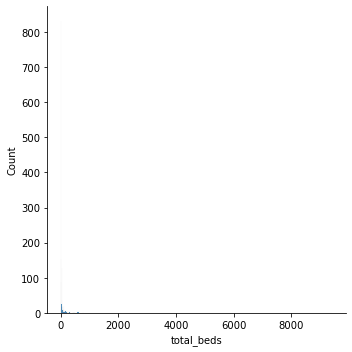

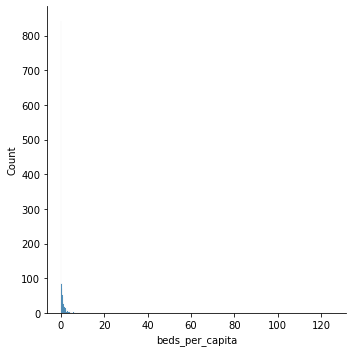

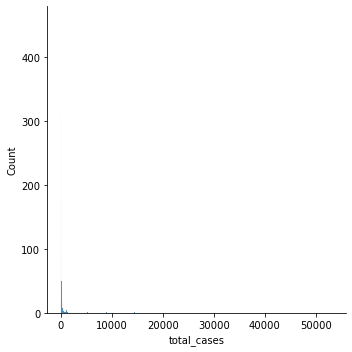

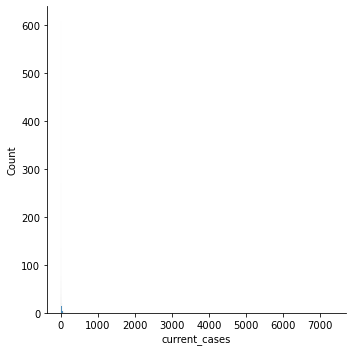

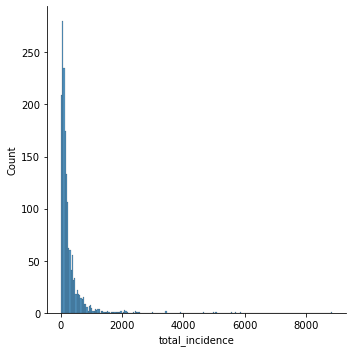

...

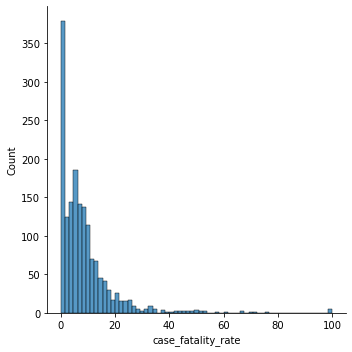

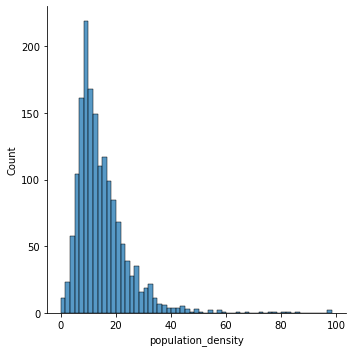

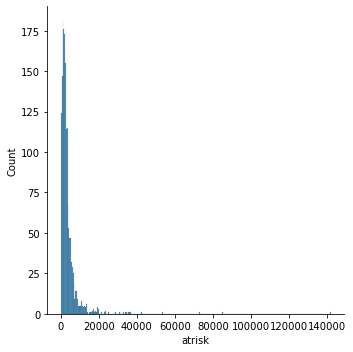

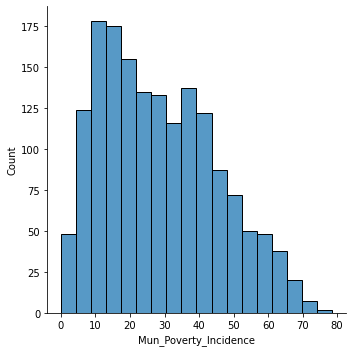

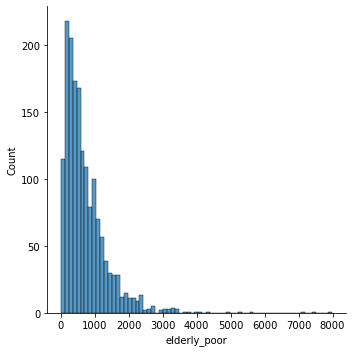

In [17]:
columns = ['total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor']
for column in columns:
    sns.displot(final_df[column])
    #plt.title(column)

### Infirmary and Hospitals

In [384]:
final_df[['total_beds','beds_per_capita']].describe()

,total_beds,beds_per_capita
count,1647.000000,1647.000000
mean,70.573770,0.742619
std,327.253324,4.144936
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,28.000000,0.694717
max,9414.000000,124.948903


In [385]:
# percent of municipalities that have 0 beds
final_df[final_df['total_beds']==0]['total_beds'].count()/final_df['total_beds'].count()*100

50.394656952034

In [388]:
# percent of municipalities that have  less than 1 bed per 1000 population
final_df[final_df['beds_per_capita']<1]['beds_per_capita'].count()/final_df['beds_per_capita'].count()*100

81.72434729811779

In [377]:
# percent of municipalities with adjacent neighbors that has more than an average of 1 bed per 1000 population
final_df[final_df['beds_per_capita_lag']>1]['beds_per_capita_lag'].count()/final_df['beds_per_capita_lag'].count()*100

18.275652701882212

### Covid

In [389]:
final_df[['total_cases','total_incidence','current_cases','current_incidence','case_fatality_rate']].describe()

,total_cases,total_incidence,current_cases,current_incidence,case_fatality_rate
count,1647.000000,1647.000000,1647.000000,1647.000000,1647.000000
mean,377.721919,280.606884,41.896175,30.057581,8.531360
std,1999.814351,519.421019,266.673780,90.908656,10.699846
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,18.000000,68.278029,1.000000,1.613928,1.997783
50%,46.000000,138.140627,3.000000,8.754364,6.060606
75%,135.500000,303.482546,11.000000,22.786050,11.108730
max,53169.000000,8849.979561,7318.000000,1587.409729,100.000000


In [390]:
# municipalities that have no recorded covid cases
final_df[final_df['total_incidence']==0]['total_incidence'].count()

22

In [391]:
# percent municipalities that currently have COVID 19 cases
final_df[final_df['current_incidence']>0]['current_incidence'].count()/final_df['current_incidence'].count()*100

76.50273224043715

In [392]:
#minimum current incidence for municipalities that have COVID-19 cases 
final_df[final_df['current_incidence']>0]['current_incidence'].min()

0.705432535959423

In [393]:
# percent municipalities that currently have no COVID 19 deaths
final_df[final_df['case_fatality_rate']==0]['case_fatality_rate'].count()/final_df['case_fatality_rate'].count()*100

21.311475409836063

In [394]:
# percent municipalities that currently have greater than 2.2% (2.1M/128M)
final_df[final_df['case_fatality_rate']>0.22]['case_fatality_rate'].count()/final_df['case_fatality_rate'].count()*100

78.68852459016394

### Others

In [395]:
final_df[['population_density','atrisk','Mun_Poverty_Incidence','elderly_poor']].describe()

,population_density,atrisk,Mun_Poverty_Incidence,elderly_poor
count,1647.000000,1647.000000,1647.000000,1647.000000
mean,14.949168,3597.293868,28.548391,727.926948
std,9.827326,6121.884833,16.622035,697.888657
min,0.000000,-1.000000,0.000000,0.000000
25%,8.745000,1248.000000,14.400000,278.312500
50%,12.610000,2311.000000,26.300000,540.640000
75%,18.635000,3900.000000,40.400000,969.309000
max,98.480000,141806.000000,78.500000,7985.600000


## Visualize the data using geopandas

Health Facility data

C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


<AxesSubplot:>

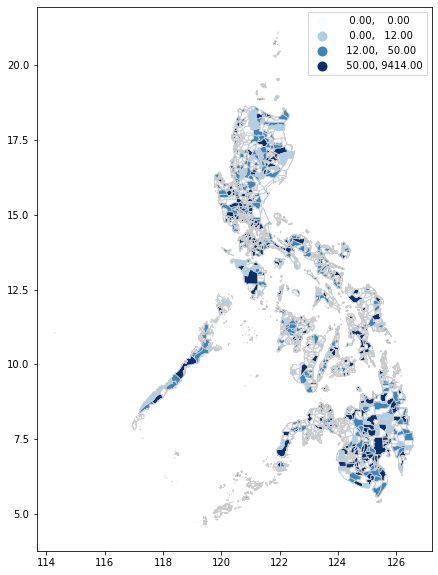

In [18]:
variable = 'total_beds'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


<AxesSubplot:>

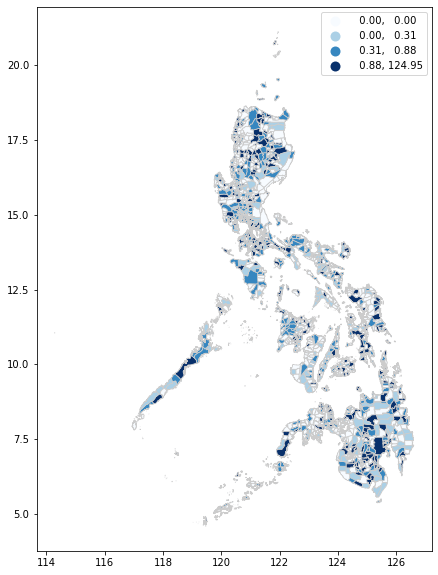

In [19]:
variable = 'beds_per_capita'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

COVID Data

<AxesSubplot:>

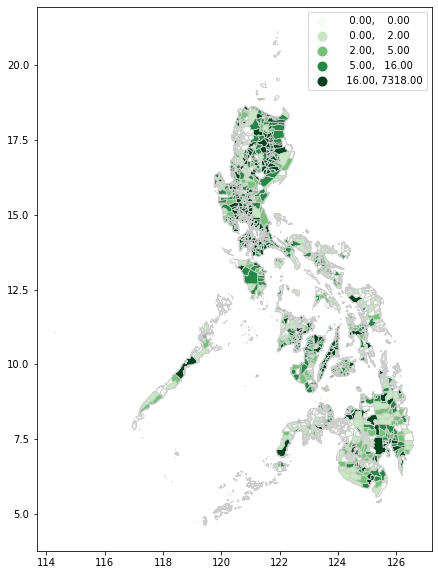

In [20]:
variable = 'current_cases'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

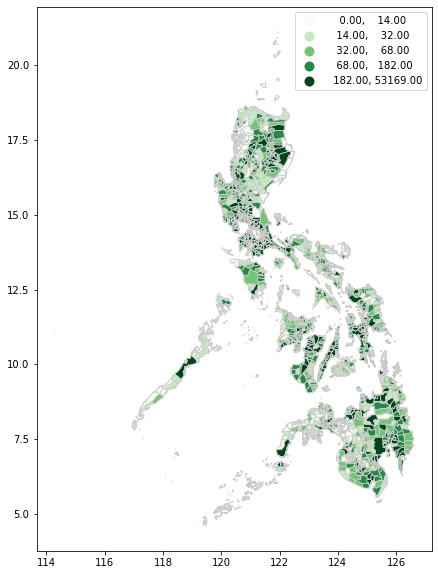

In [21]:
variable = 'total_cases'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

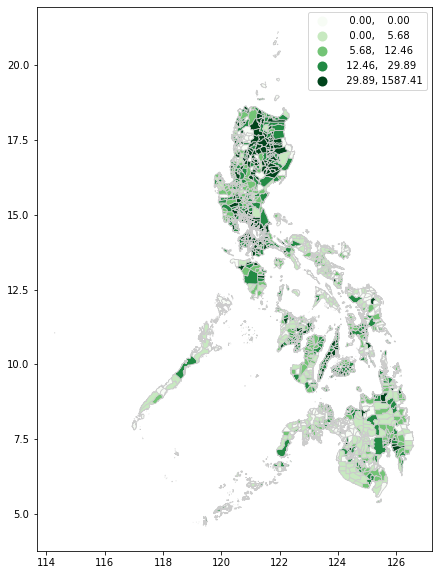

In [22]:
variable = 'current_incidence'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

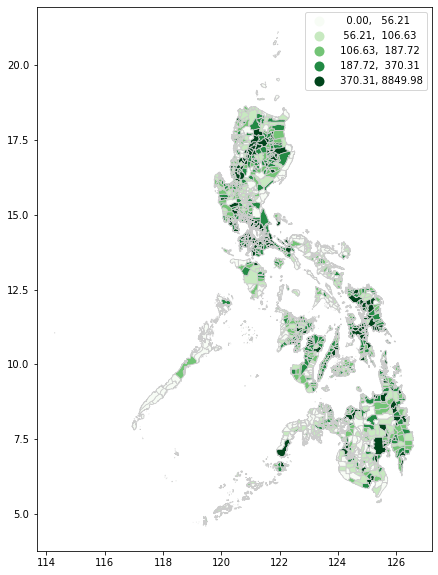

In [23]:
variable = 'total_incidence'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

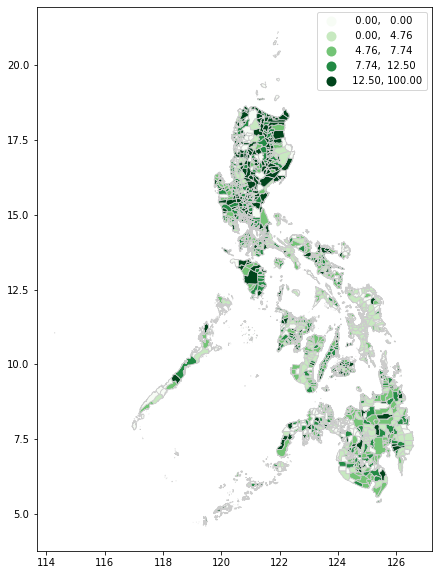

In [24]:
variable = 'case_fatality_rate'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

Population Data

<AxesSubplot:>

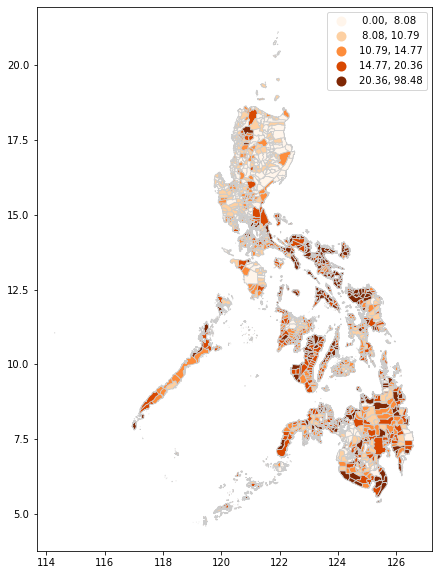

In [25]:
variable = 'population_density'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Oranges', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

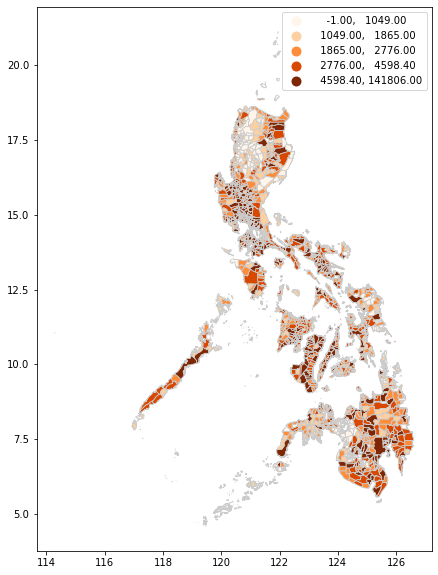

In [26]:
variable = 'atrisk'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Oranges', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

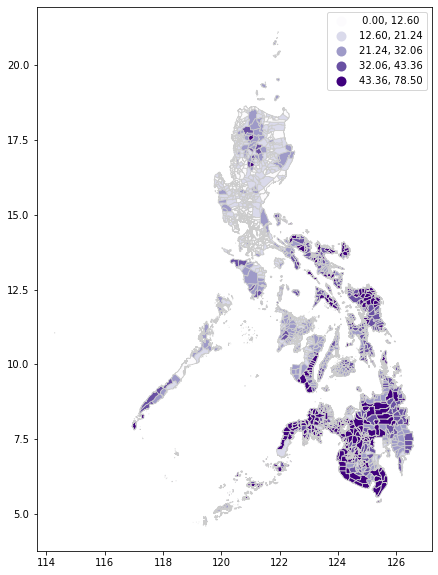

In [28]:
variable = 'Mun_Poverty_Incidence'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Purples', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

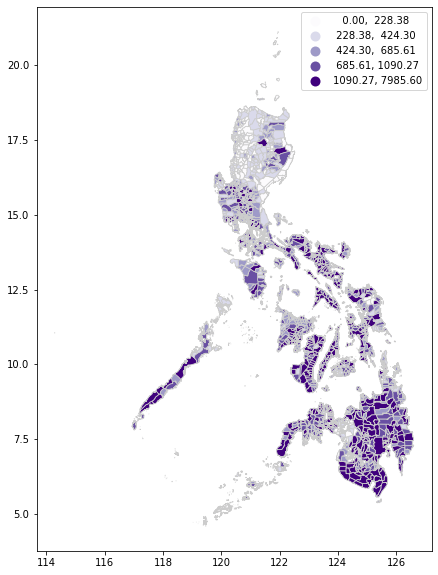

In [29]:
variable = 'elderly_poor'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Purples', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

Outliers

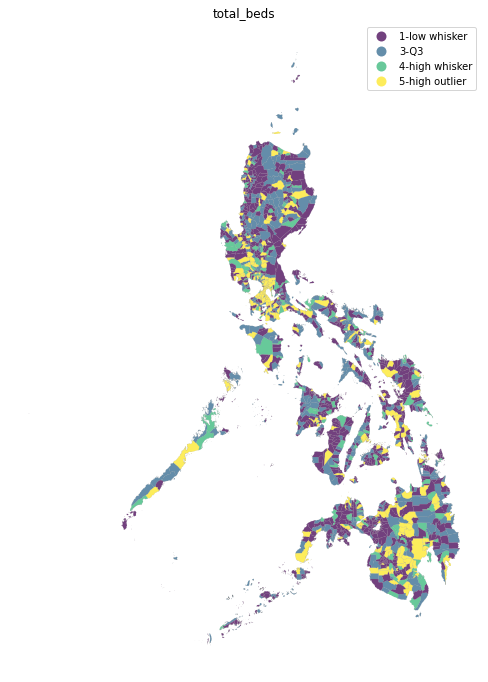

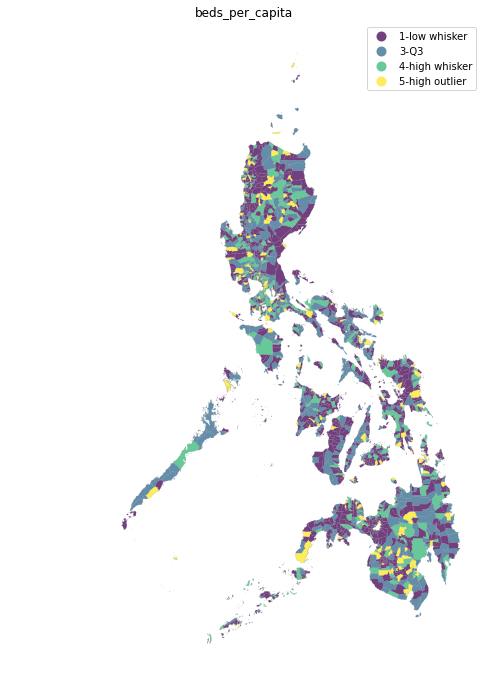

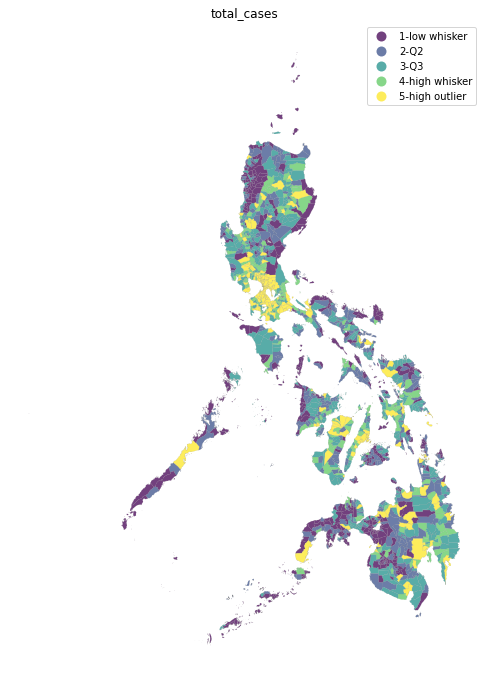

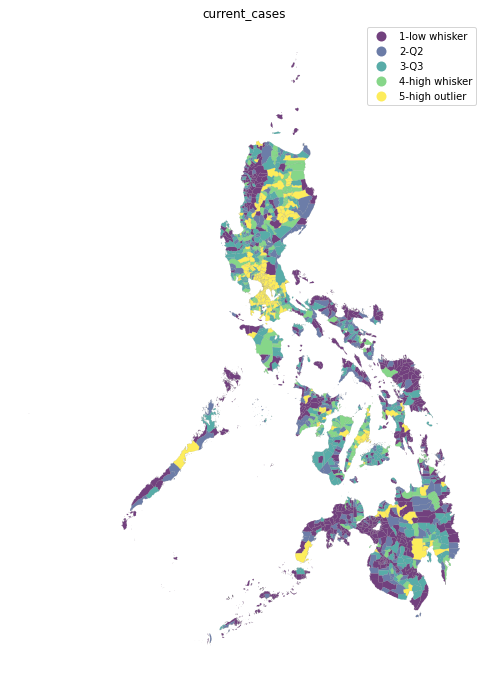

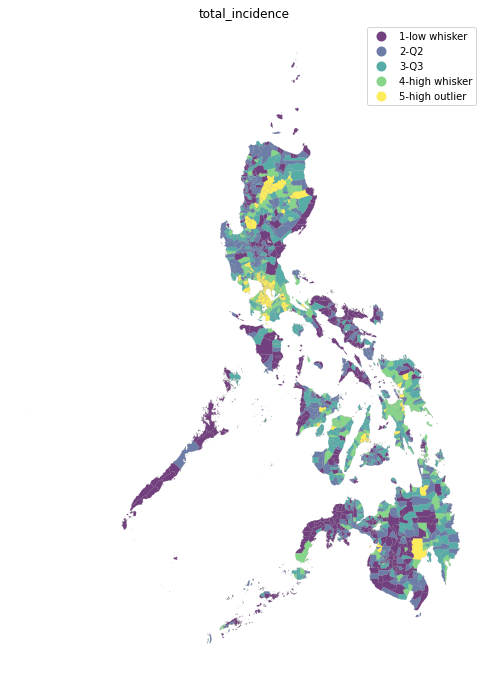

...

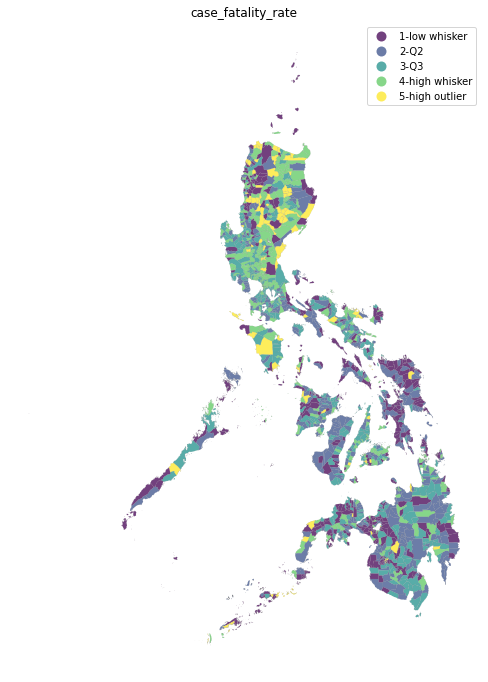

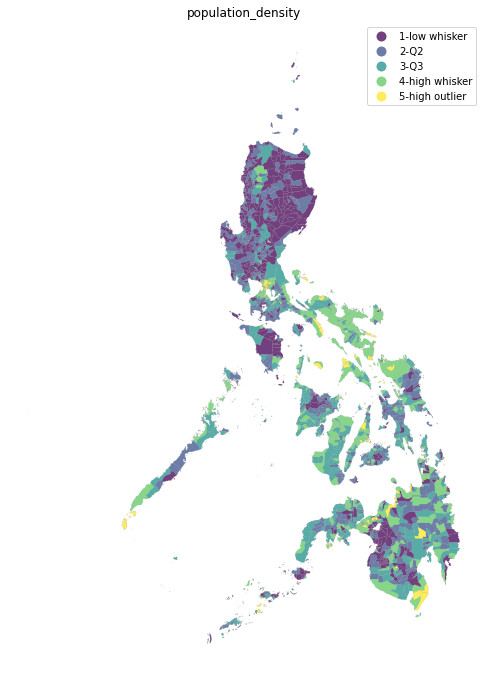

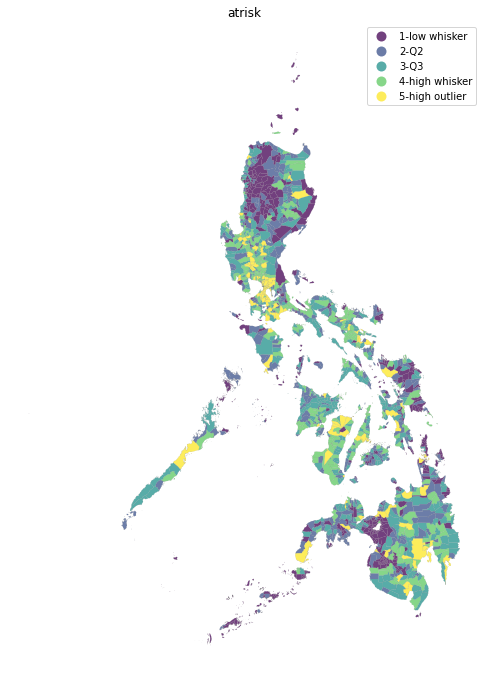

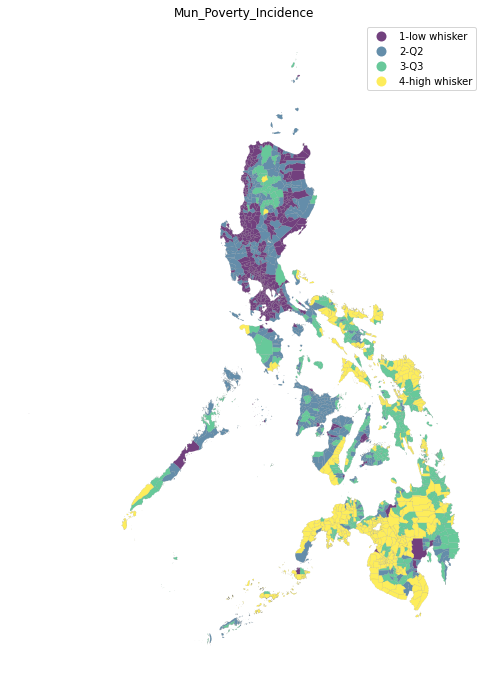

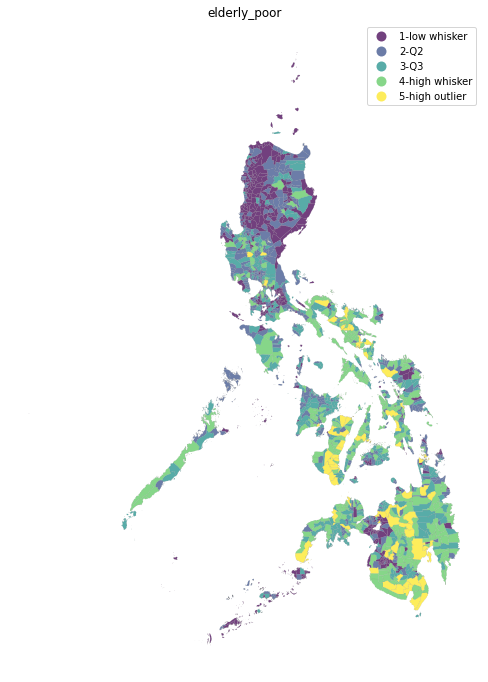

In [30]:
columns = ['total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor']
labels = ['0-low outlier', '1-low whisker',
          '2-Q2', '3-Q3', '4-high whisker', '5-high outlier']
for column in columns:
    y = final_df[column]
    bp = mc.BoxPlot(y)
    bpl = [ labels[b] for b in bp.yb ]
    f, ax = plt.subplots(1, figsize=(12, 12))
    final_df.assign(cl=bpl).plot(column='cl', categorical=True, \
                                      k=4, cmap='viridis', linewidth=0.1, ax=ax,\
                                      edgecolor='grey', legend=True, alpha=0.75)
    ax.set_axis_off()
    plt.title(column)
    plt.show()

Check the correlation of the different features

In [31]:
features = final_df[['total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor'
                    ]]

<AxesSubplot:>

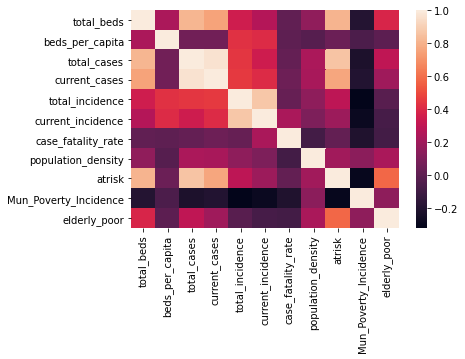

In [32]:
sns.heatmap(features.corr())

## Spatial Analysis of the Municipalities

In [33]:
final_df['geometry'] = final_df['geometry'].to_crs(epsg=3395)

In [34]:
spatial_ana = final_df

In [35]:
wq = Queen.from_dataframe(spatial_ana)

C:\Users\gear\anaconda3\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 83 disconnected components.
 There are 46 islands with ids: 13, 44, 115, 159, 213, 285, 303, 311, 329, 451, 454, 486, 610, 611, 652, 654, 672, 691, 793, 796, 928, 942, 1091, 1111, 1114, 1134, 1169, 1201, 1213, 1229, 1259, 1306, 1363, 1413, 1427, 1449, 1458, 1470, 1471, 1480, 1505, 1511, 1570, 1581, 1610, 1646.
  warnings.warn(message)


In [36]:
wq.islands

[13,
 44,
 115,
 159,
 213,
 285,
 303,
 311,
 329,
 451,
 454,
 486,
 610,
 611,
 652,
 654,
 672,
 691,
 793,
 796,
 928,
 942,
 1091,
 1111,
 1114,
 1134,
 1169,
 1201,
 1213,
 1229,
 1259,
 1306,
 1363,
 1413,
 1427,
 1449,
 1458,
 1470,
 1471,
 1480,
 1505,
 1511,
 1570,
 1581,
 1610,
 1646]

In [37]:
wknn1 = KNN.from_dataframe(spatial_ana)
wfixed = weights.set_operations.w_union(wq, wknn1)

C:\Users\gear\anaconda3\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 29 disconnected components.
  warnings.warn(message)
C:\Users\gear\anaconda3\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 20 disconnected components.
  warnings.warn(message)


In [38]:
wfixed.islands

[]

In [39]:
wfixed.transform = 'R'

(<Figure size 864x864 with 1 Axes>, <AxesSubplot:>)

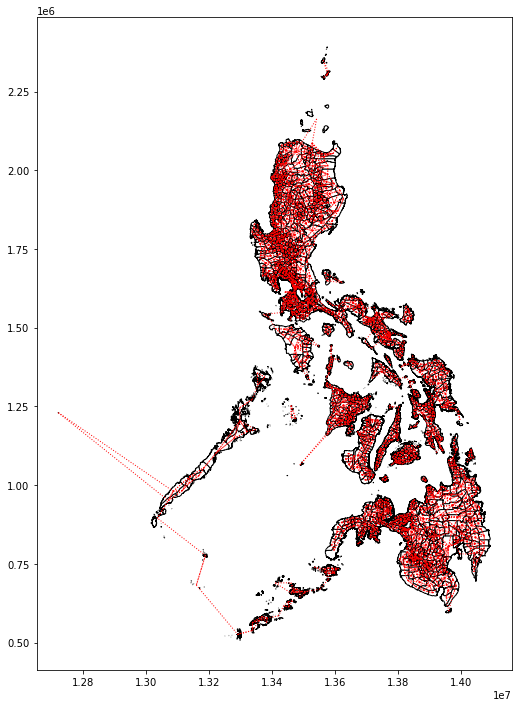

In [40]:
ax = final_df.plot(edgecolor='k', facecolor='w', figsize=(12, 12))
wfixed.plot(spatial_ana, ax=ax, 
        edge_kws=dict(color='r', linestyle=':', linewidth=1),
        node_kws=dict(marker=''))
#ax.set_axis_off()

### Spatial Lag

C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


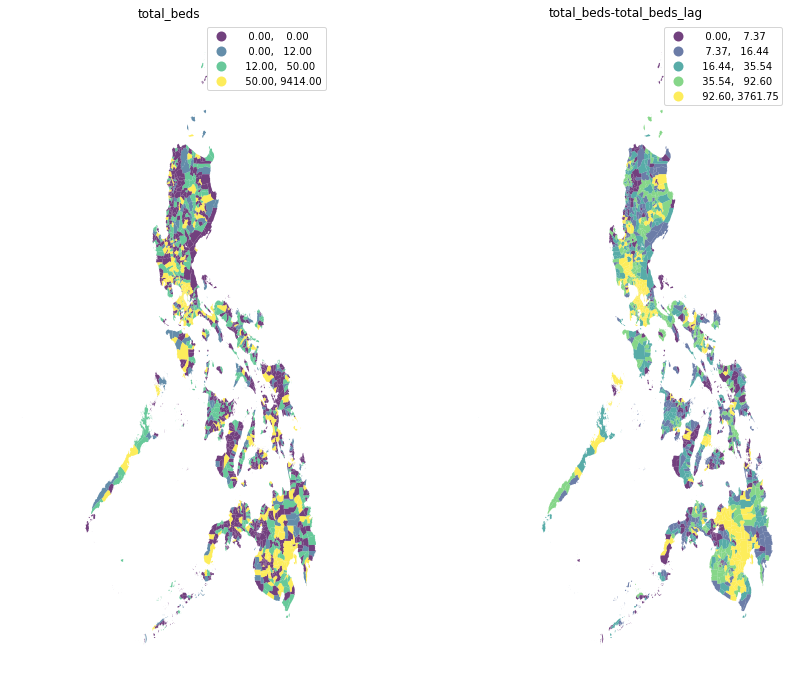

C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


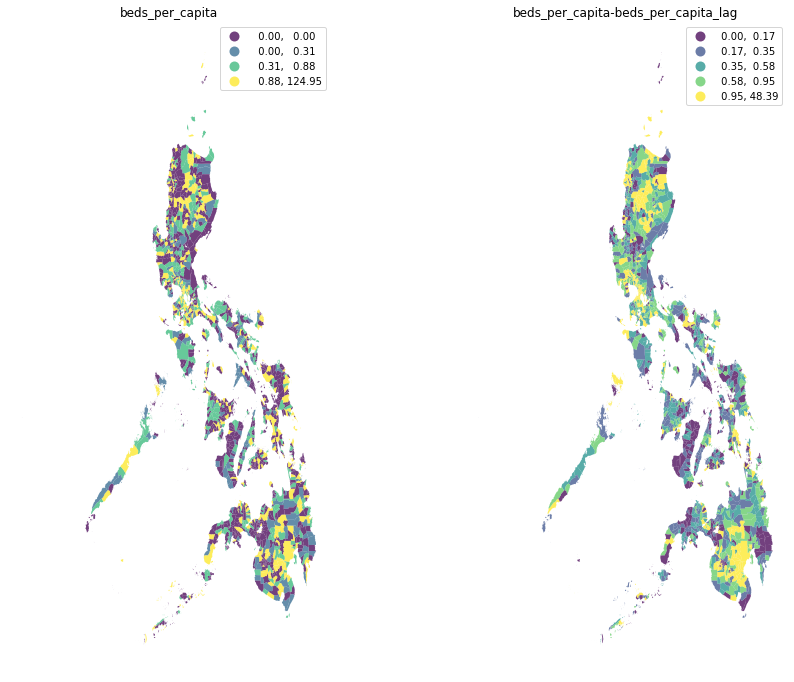

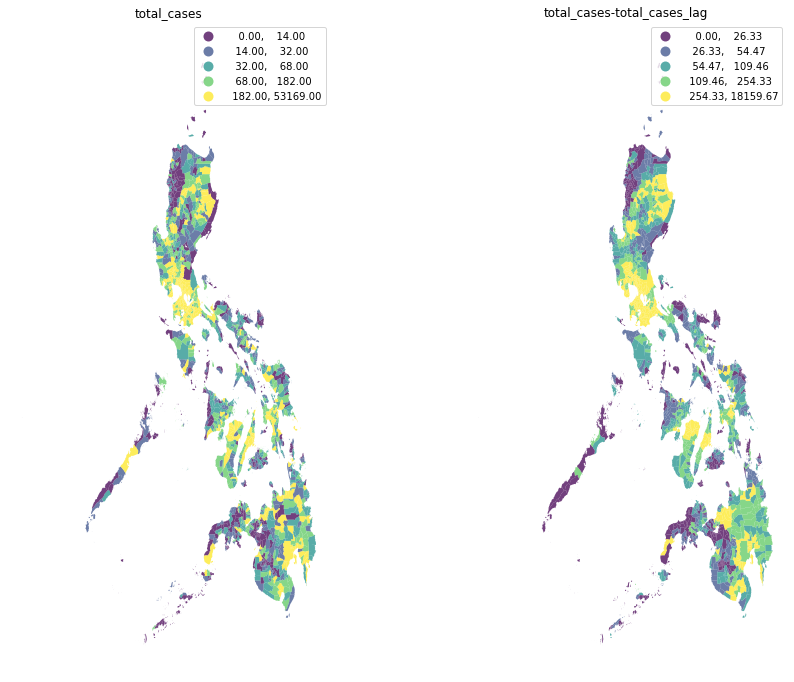

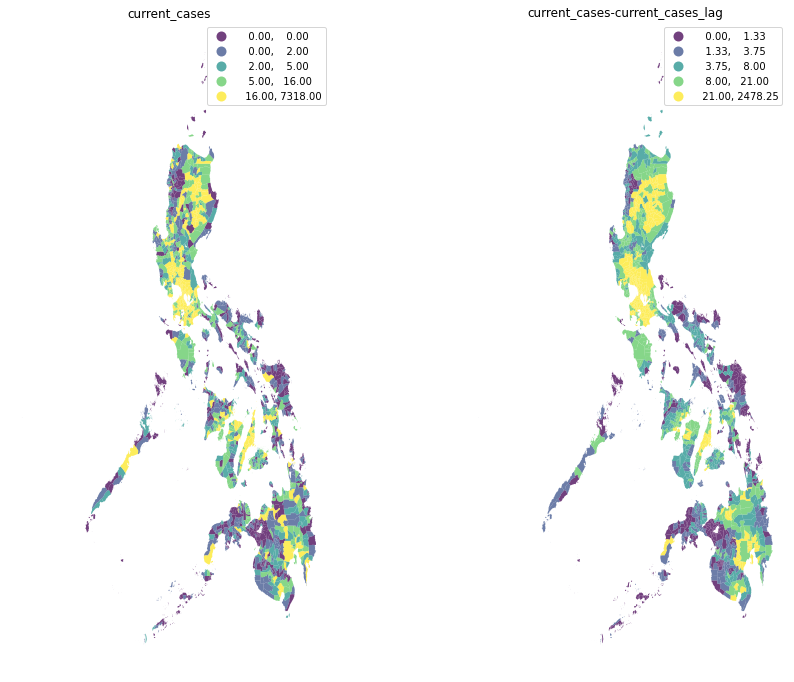

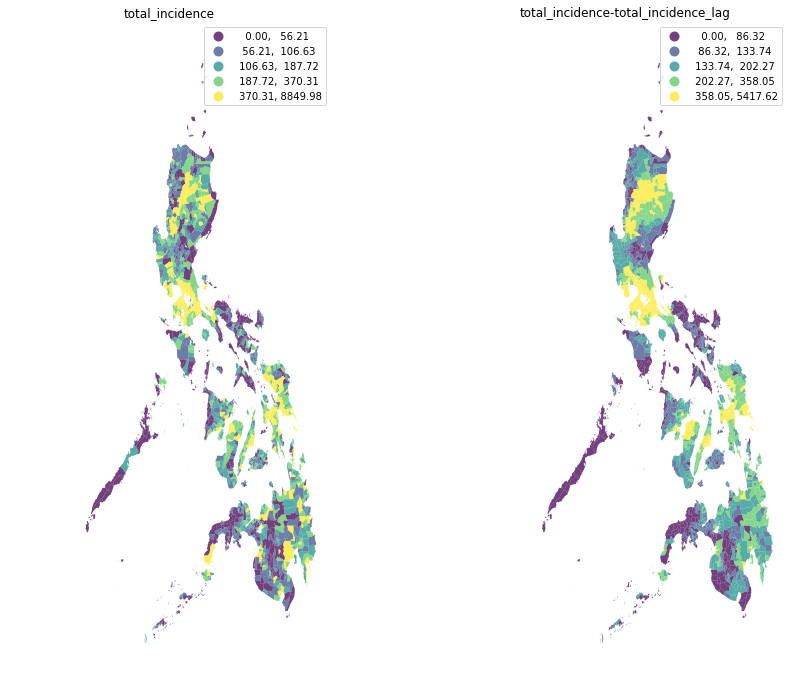

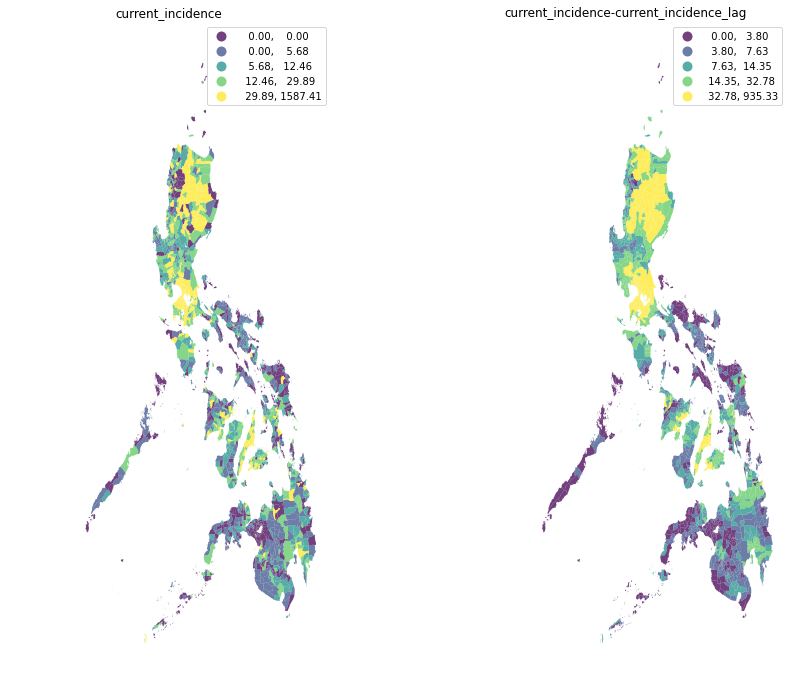

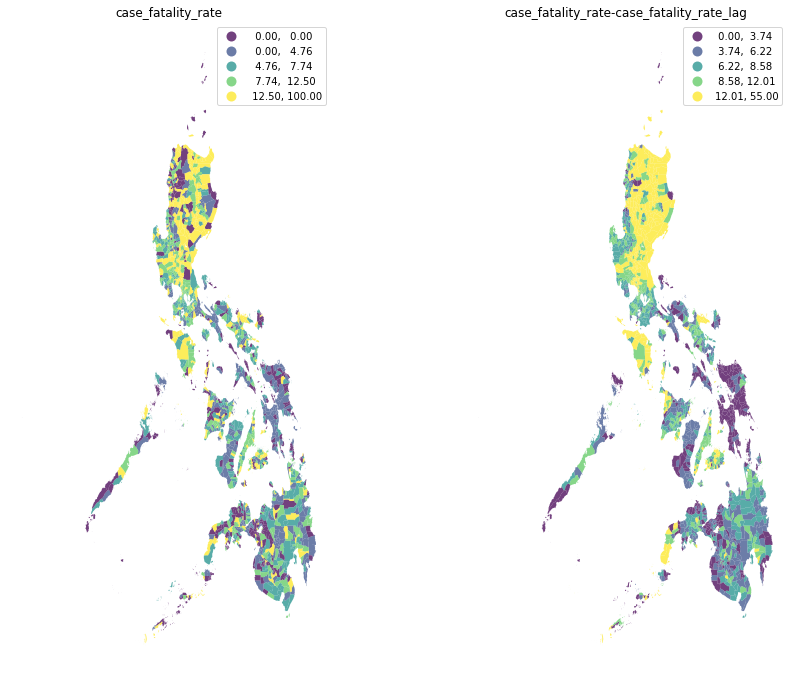

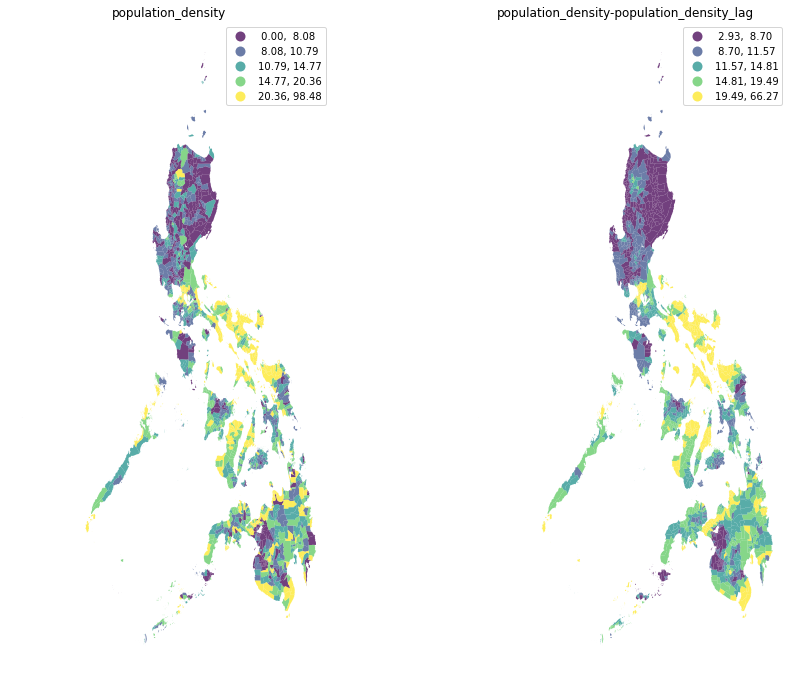

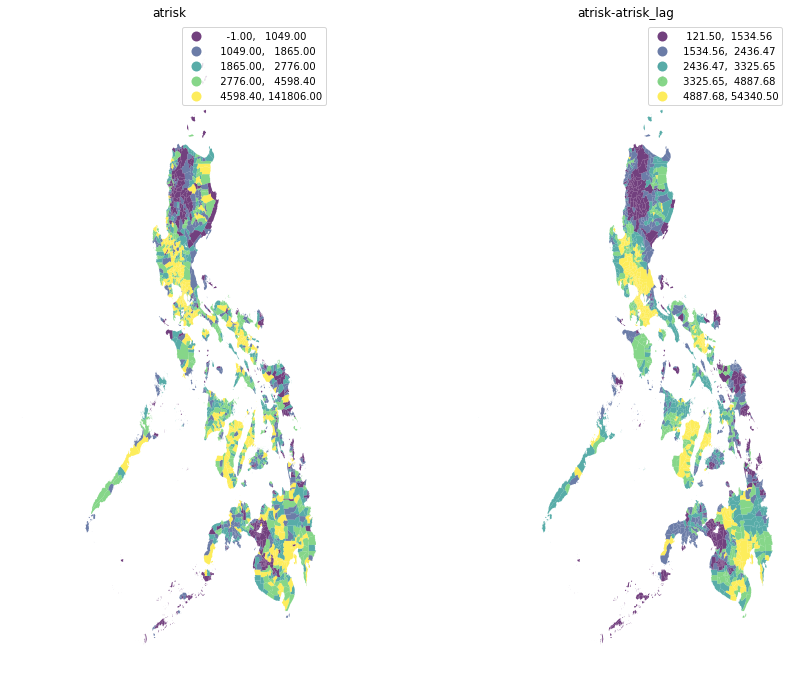

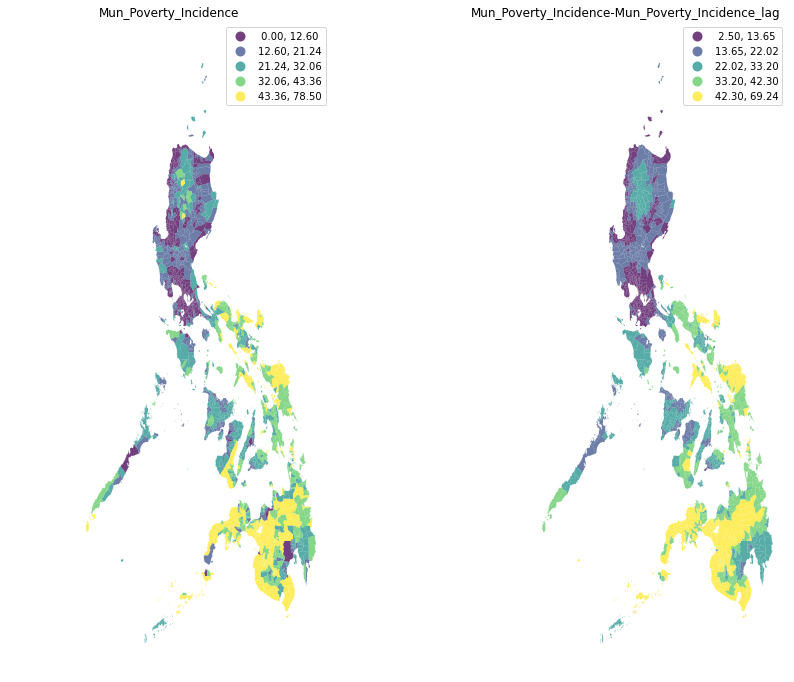

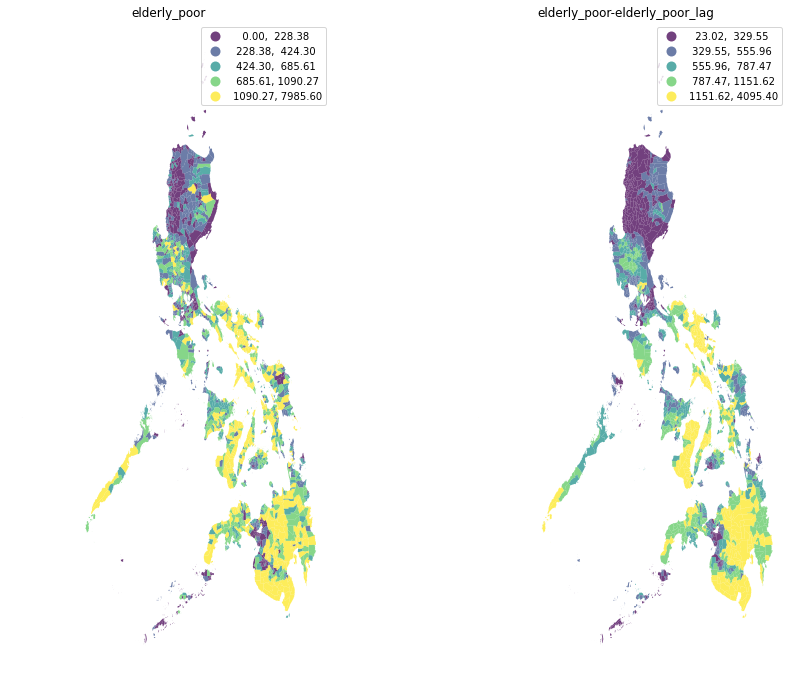

In [41]:
cluster_variables =  ['total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor'
]
lag_variables =  ['total_beds_lag', 
           'beds_per_capita_lag',
           'total_cases_lag',
           'current_cases_lag', 
           'total_incidence_lag',
           'current_incidence_lag',
           'case_fatality_rate_lag',
           'population_density_lag',
           'atrisk_lag', 
           'Mun_Poverty_Incidence_lag',
           'elderly_poor_lag'
]

for i in range(len(cluster_variables)):
    spatial_ana[lag_variables[i]] = weights.lag_spatial(wfixed, spatial_ana[cluster_variables[i]])
    f, axs = plt.subplots(1, 2, figsize=(15, 12))
    ax1, ax2 = axs

    spatial_ana.plot(column=cluster_variables[i], cmap='viridis', scheme='quantiles',
        k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax1)
    ax1.set_axis_off()
    ax1.set_title(cluster_variables[i])
    spatial_ana.plot(column=lag_variables[i], cmap='viridis', scheme='quantiles',
        k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax2)
    ax2.set_axis_off()
    ax2.set_title(cluster_variables[i] + '-' + lag_variables[i])
    plt.show()

### Global spatial autocorrelation

In [42]:
cluster_variables =  [
                     'total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor'
]

In [43]:
# Set seed for reproducibility
np.random.seed(123456)
# Calculate Moran's I for each variable
mi_results = [Moran(spatial_ana[variable], wfixed) for variable in cluster_variables]
# Display on table
table = pd.DataFrame([(variable, res.I, res.p_sim) \
                          for variable,res \
                          in zip(cluster_variables, mi_results)
                         ], columns=['Variable', "Moran's I", 'P-value']
                        )\
              .set_index('Variable')
table

,Moran's I,P-value
Variable,,
total_beds,0.242968,0.001
beds_per_capita,0.065100,0.005
total_cases,0.498725,0.001
current_cases,0.509059,0.001
total_incidence,0.651323,0.001
current_incidence,0.590455,0.001
case_fatality_rate,0.184448,0.001
population_density,0.532474,0.001
atrisk,0.373830,0.001


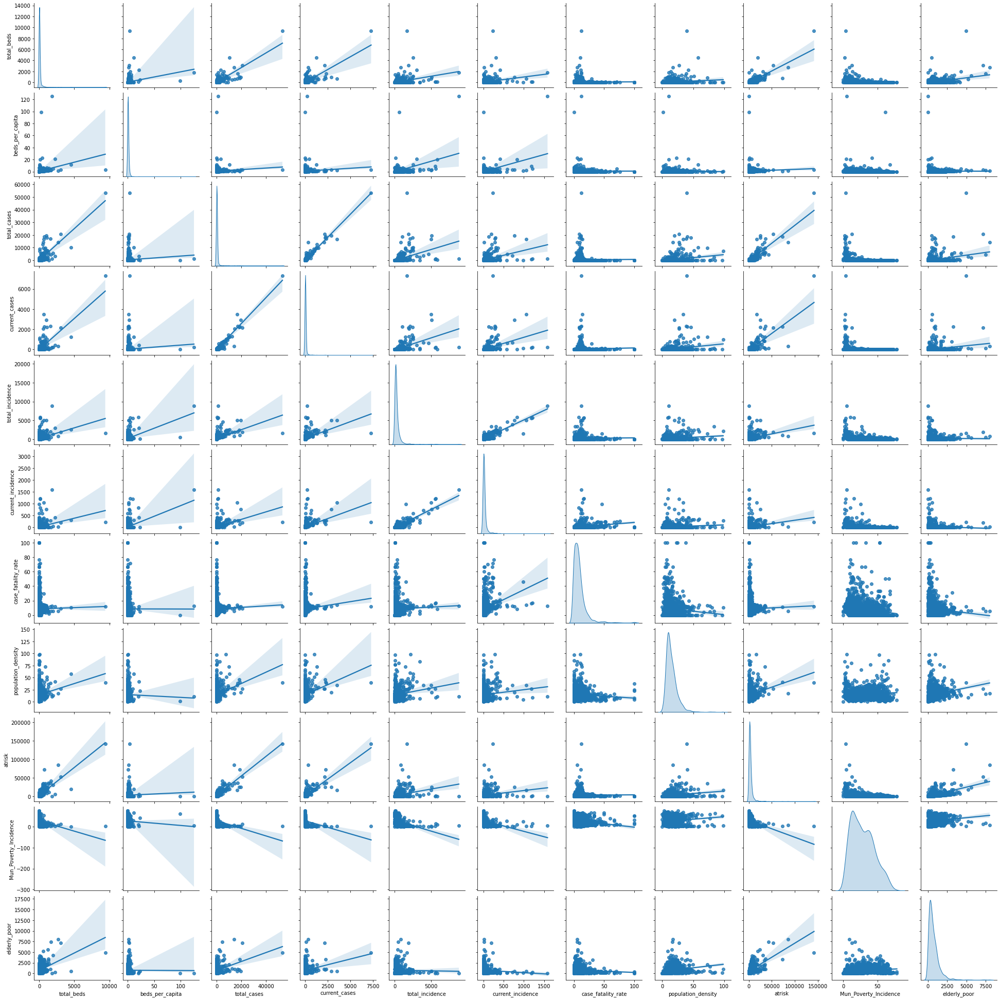

In [44]:
_ = sns.pairplot(spatial_ana[cluster_variables], kind='reg', diag_kind='kde')

### Local spatial autocorrelation

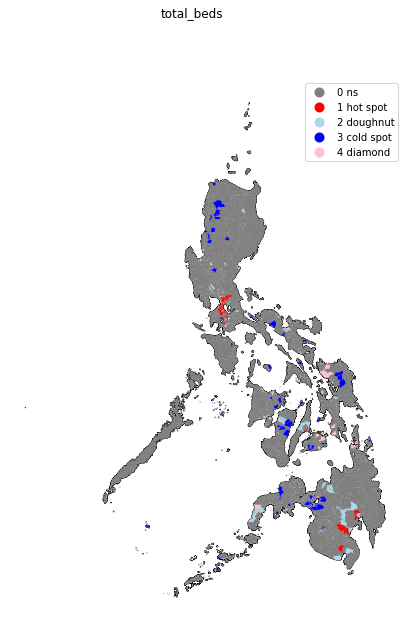

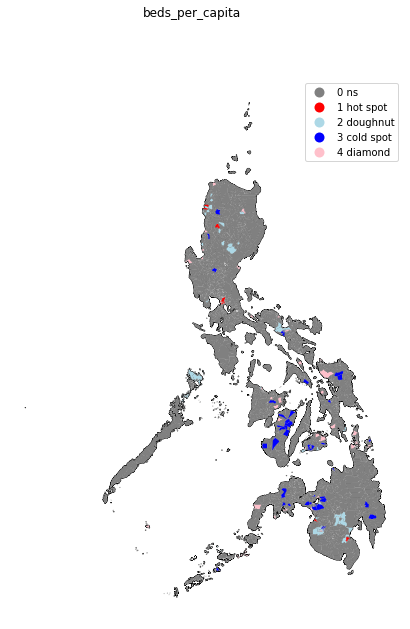

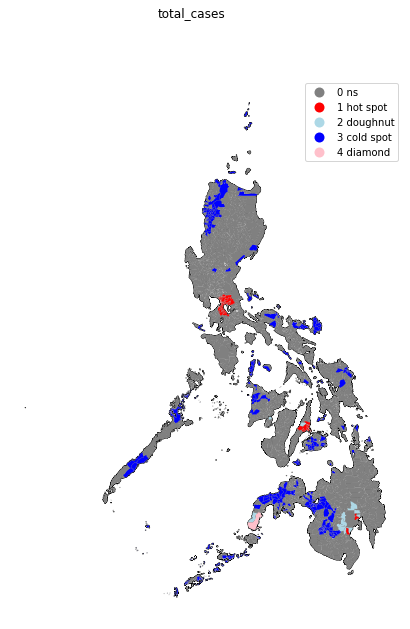

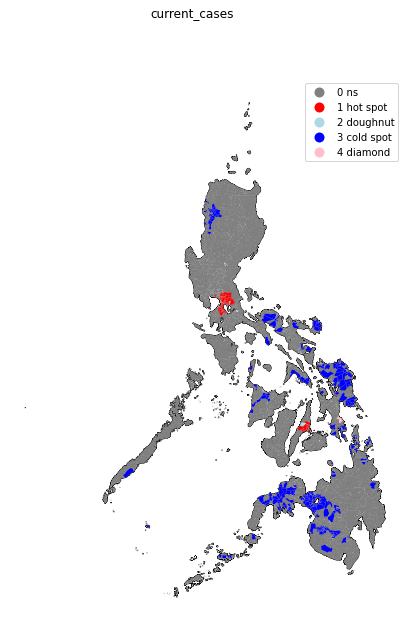

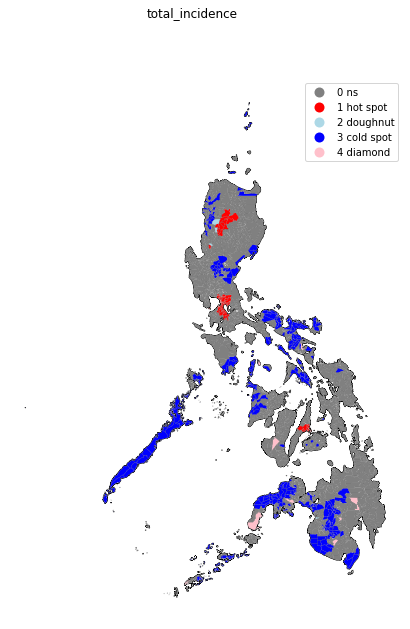

...

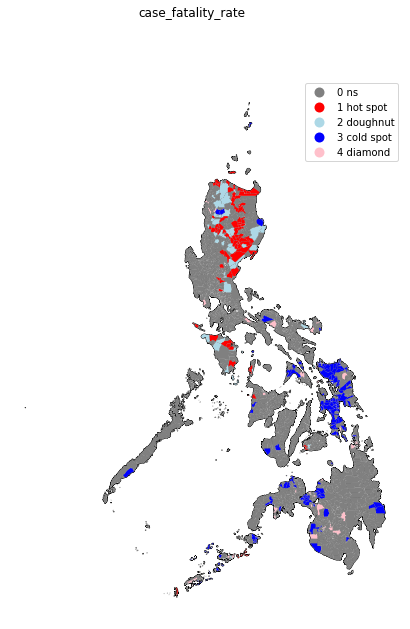

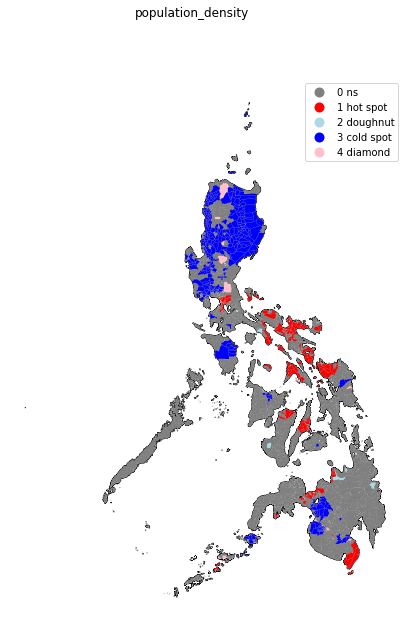

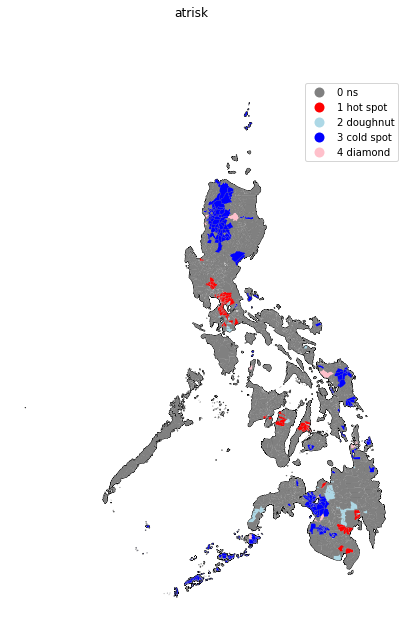

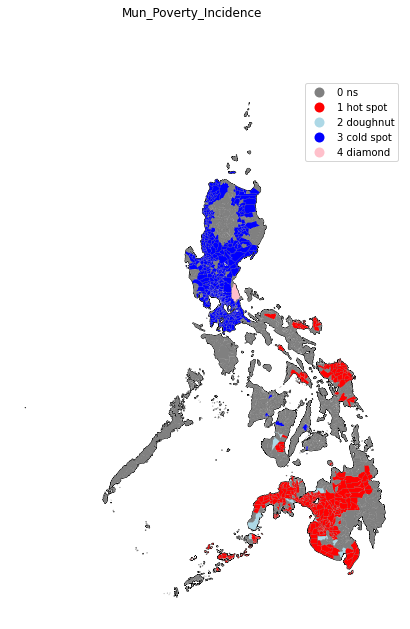

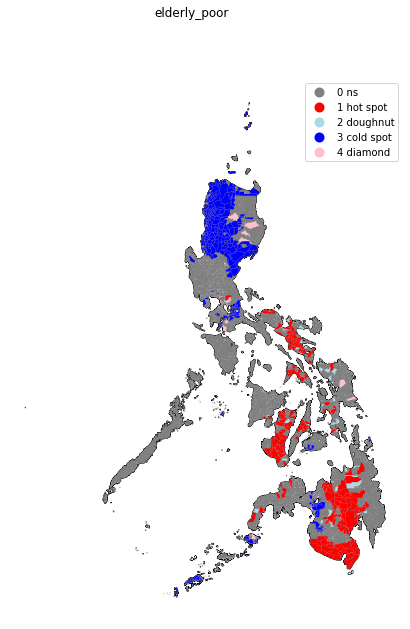

In [46]:
cluster_variables =  [
                     'total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor'
]
for variable in cluster_variables:
    lisa = Moran_Local(spatial_ana[variable], wfixed)
    spatial_ana['Is'] = lisa.Is
   

    sig = 1 * (lisa.p_sim < 0.05)
   
    hotspot = 1 * (sig * lisa.q==1)
    coldspot = 3 * (sig * lisa.q==3)
    doughnut = 2 * (sig * lisa.q==2)
    diamond = 4 * (sig * lisa.q==4)
    spots = hotspot + coldspot + doughnut + diamond
    spot_labels = [ '0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
    labels = [spot_labels[i] for i in spots]
    hmap = ListedColormap([ 'grey', 'red', 'lightblue', 'blue', 'pink'])

    ax = final_df.plot(edgecolor='k', facecolor='w', figsize=(15, 10))
    spatial_ana.assign(cl=labels).plot(column='cl', categorical=True, \
            k=2, cmap=hmap, linewidth=0.1, ax=ax, \
            edgecolor='white', legend=True)


    ax.set_aspect('equal')
    ax.set_axis_off()


    # Display the figure
    plt.suptitle(variable)
    plt.show()

## Feature engineering

## Evaluator

In [321]:
#evaluator
def evaluator(df, variable):
    print(df['cluster_labels'].value_counts())
    # Index db on cluster ID
    analysis_df2 = df
    analysis_df2 = analysis_df2.set_index('cluster_labels')
    # Keep only variables used for clustering
    analysis_df2 = analysis_df2[variable]
    # Stack column names into a column, obtaining 
    # a "long" version of the dataset
    analysis_df2 = analysis_df2.stack()
    # Take indices into proper columns
    analysis_df2 = analysis_df2.reset_index()
    # Rename column names
    analysis_df2 = analysis_df2.rename(columns={
                                'level_1': 'Attribute', 
                               0: 'Values'})
    #Setup the facets
    facets = sns.FacetGrid(data=analysis_df2, col='Attribute', hue='cluster_labels', \
                          sharey=False, sharex=False, aspect=2, col_wrap=3)
    # Build the plot as a `sns.kdeplot`
    _ = facets.map(sns.kdeplot, 'Values', shade=True).add_legend()
    return
# mapping the clusters
def mapper(df):
    # Setup figure and ax
    f, ax = plt.subplots(1, figsize=(12, 12))
    # Plot unique values choropleth including a legend and with no boundary lines
    df.plot(column='cluster_labels', categorical=True, legend=True, linewidth=0, ax=ax, cmap='viridis')
    # Remove axis
    ax.set_axis_off()
    # Keep axes proportionate
    plt.axis('equal')
    # Add title
    plt.title('Map of the Clusters')
    # Display the map
    plt.show()
    return
# radial graph


## Veriable

In [402]:
variable =  [
    #'total_beds',
    'beds_per_capita', 
    #'beds_per_capita_lag', 
    #'total_cases',
    #'current_cases',
    'total_incidence', 
    'current_incidence', 
    #'current_incidence_lag', 
    'case_fatality_rate', 
    'population_density', 
    'atrisk', 
    'Mun_Poverty_Incidence',
    #'elderly_poor'
]

## Clustering Kmeans

In [400]:
#scaler
from sklearn.preprocessing import StandardScaler
def stdScaler(df):
    scaler = StandardScaler()
    return scaler.fit_transform(df)

# elbow method
from sklearn.cluster import KMeans

def kMeansClustering(scaled_df):
    ssd = []
    range_n_clusters = list(np.arange(1,16))

    # running kmeans with different n
    for num_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=num_clusters, random_state=2) #random state para you can run it with other machines (reproducing the pagka-random nya)
        kmeans.fit(scaled_df)

        ssd.append(kmeans.inertia_)
    # inertia: sum of squared errors (where error = distance of centroid from a point)
    # kinukuha nya inertia for each value of k

    # plot the SSDs for each n_clusters
    plt.plot(ssd)

In [325]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
def getSilhouettes(scaled_df):
    range_n_clusters = list(np.arange(2,9))

    for num_clusters in range_n_clusters:

        # intialise kmeans
        kmeans = KMeans(n_clusters=num_clusters, random_state=2)
        kmeans.fit(scaled_df)

        cluster_labels = kmeans.predict(scaled_df)

        # silhouette score; how far they are apart
        silhouette_avg = silhouette_score(scaled_df, cluster_labels)
        print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

In [326]:
#to produce clusters
def produceClusters(n_clusters, scaled_df, random_state=2):
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    kmeans.fit(scaled_df)
    return kmeans.predict(scaled_df)

For n_clusters=2, the silhouette score is 0.42554539803708963
For n_clusters=3, the silhouette score is 0.297400524650341
For n_clusters=4, the silhouette score is 0.3261579470739108
For n_clusters=5, the silhouette score is 0.3403670522507019
For n_clusters=6, the silhouette score is 0.28917278828403303
For n_clusters=7, the silhouette score is 0.291481761267474
For n_clusters=8, the silhouette score is 0.29830289446163416
For n_clusters=2, the silhouette score is 0.3680033656239648


C:\Users\gear\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


For n_clusters=3, the silhouette score is 0.36641796496279355
For n_clusters=4, the silhouette score is 0.27622197592482955
For n_clusters=5, the silhouette score is 0.29742100392274784
For n_clusters=6, the silhouette score is 0.27920056393023096
For n_clusters=7, the silhouette score is 0.24682897322953432
For n_clusters=8, the silhouette score is 0.2615747579346537


C:\Users\gear\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
C:\Users\gear\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


For n_clusters=2, the silhouette score is 0.3195217001727948
For n_clusters=3, the silhouette score is 0.31743296288555367
For n_clusters=4, the silhouette score is 0.284982949324154
For n_clusters=5, the silhouette score is 0.2616282185217389
For n_clusters=6, the silhouette score is 0.28032104122331214
For n_clusters=7, the silhouette score is 0.2677452103326163
For n_clusters=8, the silhouette score is 0.2602014354044286
Priority 4    921
Priority 3    518
Priority 2    186
Priority 1     22
Name: cluster_labels, dtype: int64


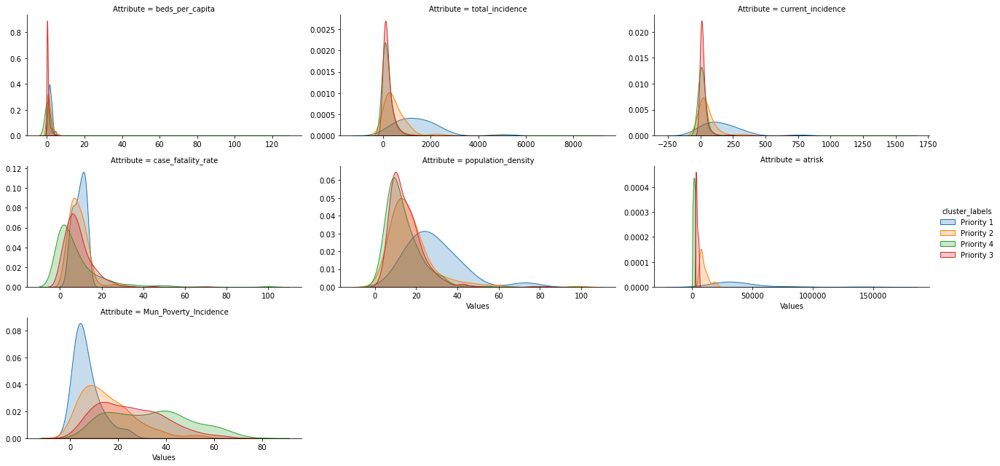

In [403]:

cluster2 = final_df.copy()
getSilhouettes(stdScaler(cluster2[variable]))
cluster2['cluster_labels'] = produceClusters(2, cluster2[variable])
table = cluster2.groupby(['cluster_labels'])['cluster_labels'].count()
if table[0]>table[1]:
    group1 = cluster2[cluster2['cluster_labels']==1]
    group1['cluster_labels'] = group1['cluster_labels'].replace(1, 'Priority 1')
    other = cluster2[cluster2['cluster_labels']==0]
else:
    group1 = cluster2[cluster2['cluster_labels']==0]
    group1['cluster_labels'] = group1['cluster_labels'].replace(0, 'Priority 1')
    other = cluster2[cluster2['cluster_labels']==1]
getSilhouettes(stdScaler(other[variable]))
other['cluster_labels'] = produceClusters(2, other[variable])
table = other.groupby(['cluster_labels'])['cluster_labels'].count()
if table[0]>table[1]:
    group2 = other[other['cluster_labels']==1]
    group2['cluster_labels'] = group2['cluster_labels'].replace(1, 'Priority 2')
    other = other[other['cluster_labels']==0]
else:
    group2 = other[other['cluster_labels']==0]
    group2['cluster_labels'] = group2['cluster_labels'].replace(0, 'Priority 2')
    other = other[other['cluster_labels']==1]
getSilhouettes(stdScaler(other[variable]))
other['cluster_labels'] = produceClusters(2, other[variable])
table = other.groupby(['cluster_labels'])['cluster_labels'].count()
if table[0]>table[1]:
    other['cluster_labels'] = other['cluster_labels'].replace(1, 'Priority 3')
    other['cluster_labels'] = other['cluster_labels'].replace(0, 'Priority 4')
else:
    other['cluster_labels'] = other['cluster_labels'].replace(0, 'Priority 3')
    other['cluster_labels'] = other['cluster_labels'].replace(1, 'Priority 4')
kmeans1 = pd.concat([group1, group2, other], ignore_index = True)
evaluator(kmeans1, variable)
mapper(kmeans1)

In [404]:
kmeans1.groupby(['cluster_labels'])[variable].mean().reset_index()

,cluster_labels,beds_per_capita,total_incidence,current_incidence,case_fatality_rate,population_density,atrisk,Mun_Poverty_Incidence
0,Priority 1,1.726334,1486.920787,169.036273,9.213278,28.789545,41179.363636,6.963636
1,Priority 2,1.455494,561.593911,60.886456,8.713238,17.407151,9618.639785,15.818817
2,Priority 3,0.581734,224.032031,21.260895,8.711783,15.122181,3813.129344,25.243050
3,Priority 4,0.665640,226.864518,25.459298,8.376864,14.024853,1362.137894,33.493811


In [416]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
kminmax = scaler.fit_transform(kmeans1[variable])
kminmax = pd.DataFrame(kminmax, index = kmeans1.index,
                      columns = variable)
kminmax['cluster_labels'] = kmeans1['cluster_labels']
kminmax = kminmax.set_index('cluster_labels')
kminmax = kminmax.groupby('cluster_labels').mean().reset_index()
kminmax

,cluster_labels,beds_per_capita,total_incidence,current_incidence,case_fatality_rate,population_density,atrisk,Mun_Poverty_Incidence
0,Priority 1,0.013816,0.168014,0.106486,0.092133,0.292339,0.290397,0.088709
1,Priority 2,0.011649,0.063457,0.038356,0.087132,0.176758,0.067836,0.201514
2,Priority 3,0.004656,0.025314,0.013393,0.087118,0.153556,0.026897,0.321568
3,Priority 4,0.005327,0.025634,0.016038,0.083769,0.142413,0.009613,0.426673


In [422]:
from math import pi
def make_spider( row, title, color):
 
    # number of variable
    categories=list(kminmax)[1:]
    N = len(categories)
 
    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
 
    # Initialise the spider plot
    ax = plt.subplot(3,3,row+1, polar=True )
 
    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 3.5)
    ax.set_theta_direction(-1)
    
    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)
 
    # Draw ylabels
    ax.set_rlabel_position(0)
#     plt.yticks([-2, -1, 0, 1, 2], [-2,-1, 0, 1, 2], color="grey", size=7) #for sscaled
#     plt.ylim(-2.5,2.5)
    plt.yticks([-0.25, 0, 0.125, 0.25, 0.325, 0.50], [-0.25, 0, 0.125, 0.25, 0.325, 0.50], color="grey", size=7) #formmscaled
    plt.ylim(-0.25,0.5)

    # Ind1
    values=kminmax.loc[row].drop('cluster_labels').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)
 
    # Add a title
    plt.title(title, size=14, color=color, y=1.1)

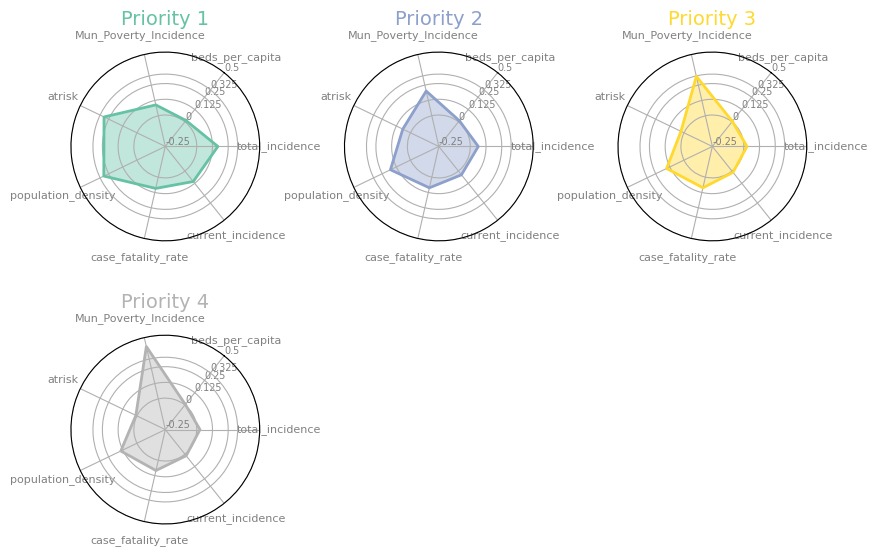

In [423]:
my_dpi=100
plt.figure(figsize=(1000/my_dpi, 1000/my_dpi), dpi=my_dpi)
plt.subplots_adjust(hspace=0.5)

# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(kminmax.index))

for row in range(0, len(kminmax.index)):
    make_spider(row=row, 
                title=(kminmax['cluster_labels'][row]), 
                color=my_palette(row))

## Affinity Propagation

In [328]:
#to produce clusters
from sklearn.cluster import AffinityPropagation
def produceClustersAP(scaled_df, random_state=2):
    model = AffinityPropagation(damping=0.9, random_state=random_state)
    model.fit(scaled_df)
    return model.predict(scaled_df)

60    142
69    136
55    123
41    104
6     100
     ... 
28      1
27      1
26      1
25      1
78      1
Name: cluster_labels, Length: 79, dtype: int64


C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.war

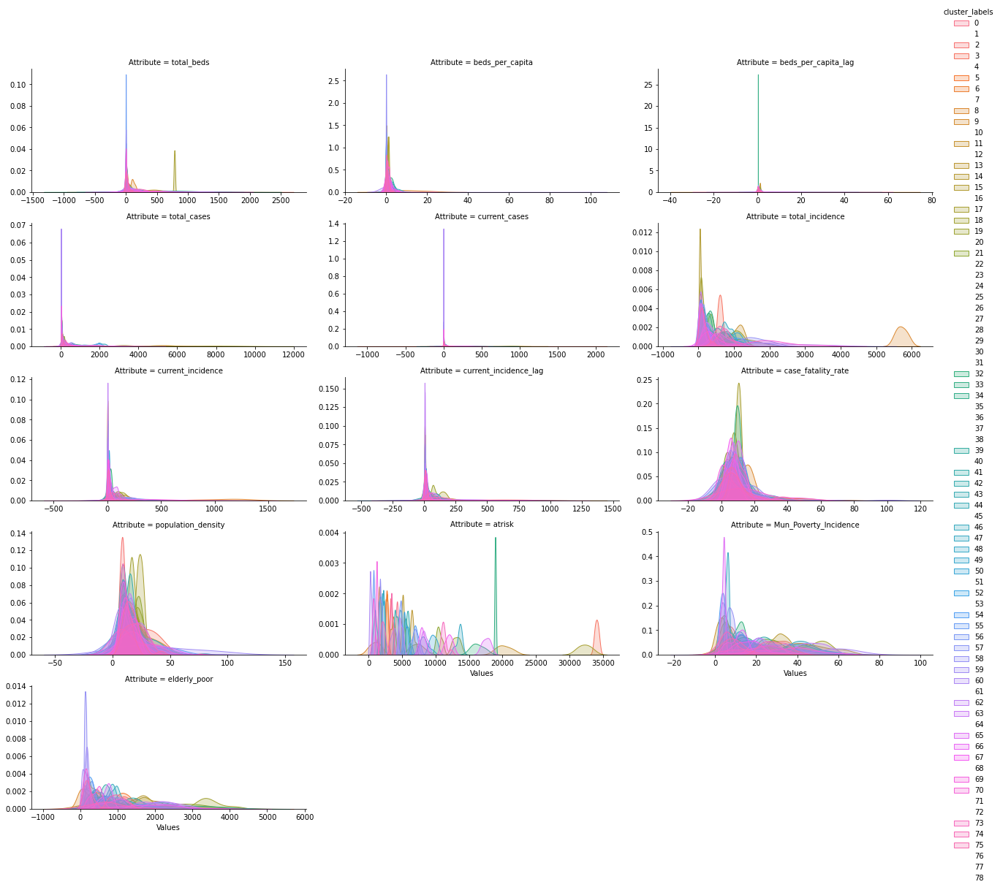

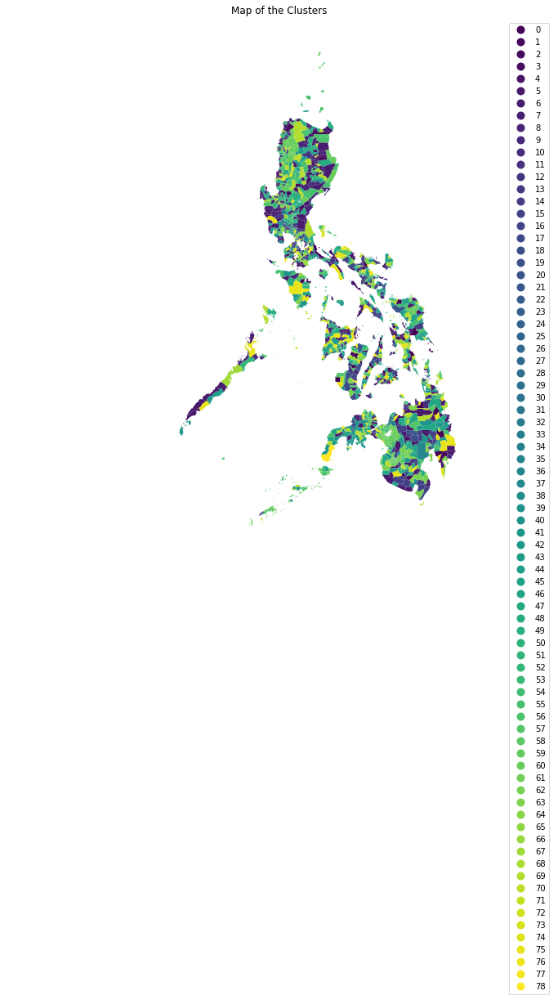

In [329]:
affinity_prop = final_df.copy()
affinity_prop['cluster_labels'] = produceClustersAP(affinity_prop[variable])
evaluator(affinity_prop, variable)
mapper(affinity_prop)

## Agglomerative Clustering

In [330]:
#to produce clusters
from sklearn.cluster import AgglomerativeClustering
def produceClustersAC(n_clusters, scaled_df, random_state=2):
    model = AgglomerativeClustering(n_clusters=n_clusters)
    return model.fit_predict(scaled_df)

3    1252
1     352
2      39
0       4
Name: cluster_labels, dtype: int64


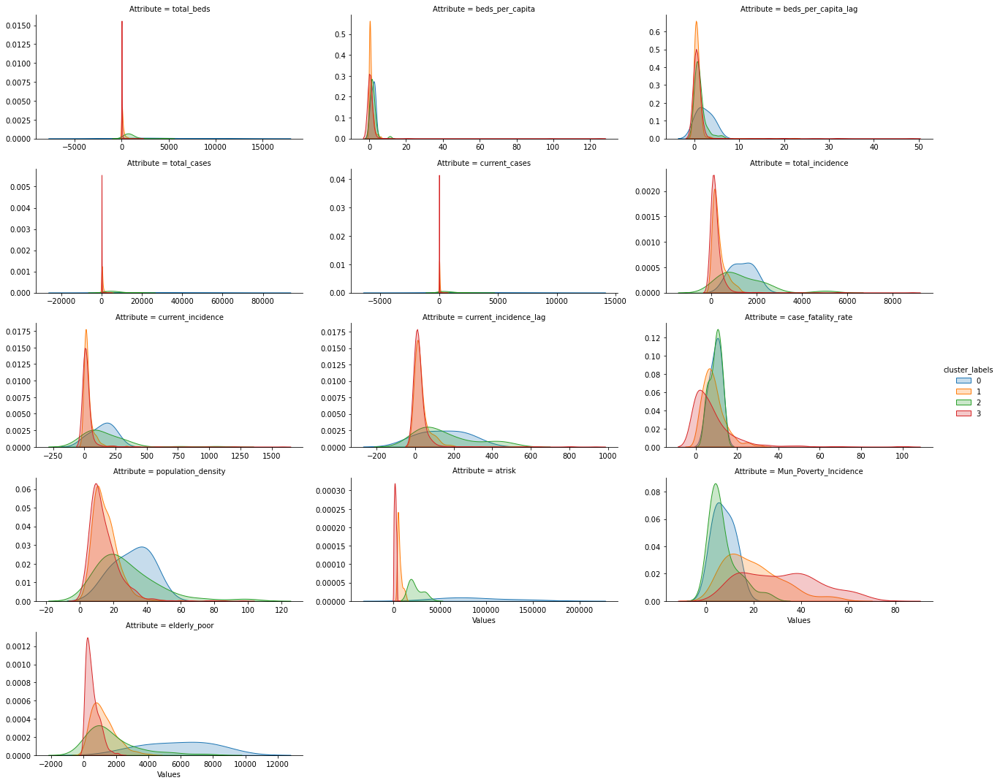

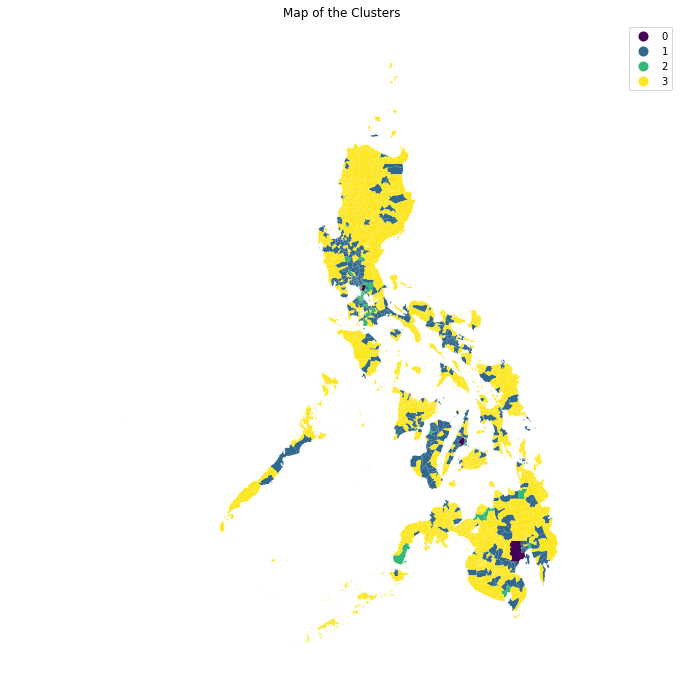

In [331]:
agglomerative = final_df.copy()
agglomerative['cluster_labels'] = produceClustersAC(4, agglomerative[variable])
evaluator(agglomerative, variable)
mapper(agglomerative)

## BIRCH

In [332]:
#to produce clusters
from sklearn.cluster import Birch
def produceClustersBirch(n_clusters, scaled_df):
    model = Birch(n_clusters=n_clusters, threshold = 0.01)
    model.fit(scaled_df)
    return model.predict(scaled_df)

3    1252
1     352
2      39
0       4
Name: cluster_labels, dtype: int64


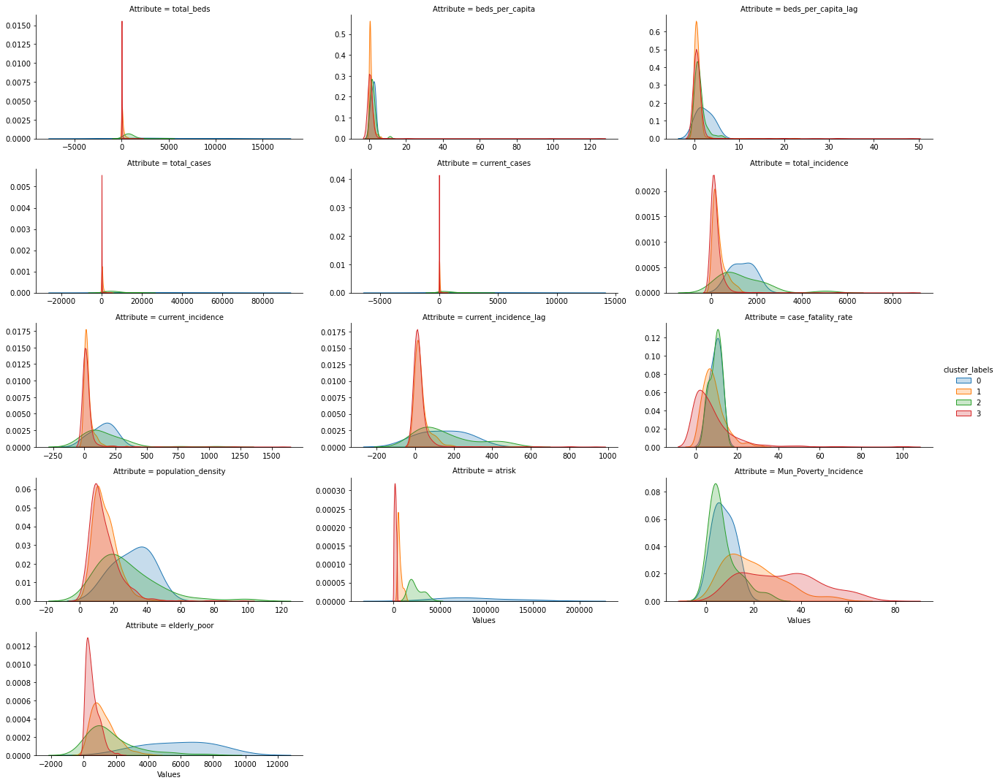

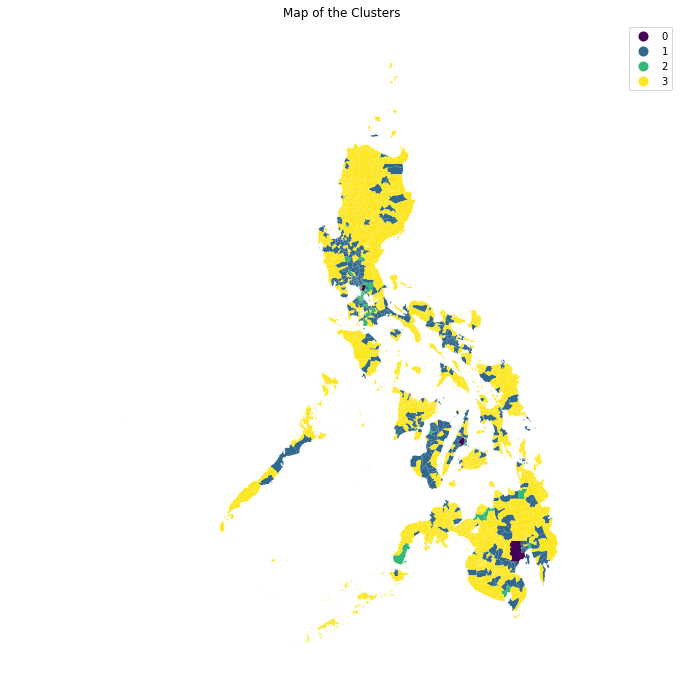

In [333]:
birch = final_df.copy()
birch['cluster_labels'] = produceClustersBirch(4, birch[variable])
evaluator(birch, variable)
mapper(birch)

## DBSCAN

In [334]:
#to produce clusters
from sklearn.cluster import DBSCAN
def produceClustersDbscan(scaled_df, random_state=2):
    model = DBSCAN(eps=0.15, min_samples = 4)
    return model.fit_predict(scaled_df)

-1    1647
Name: cluster_labels, dtype: int64


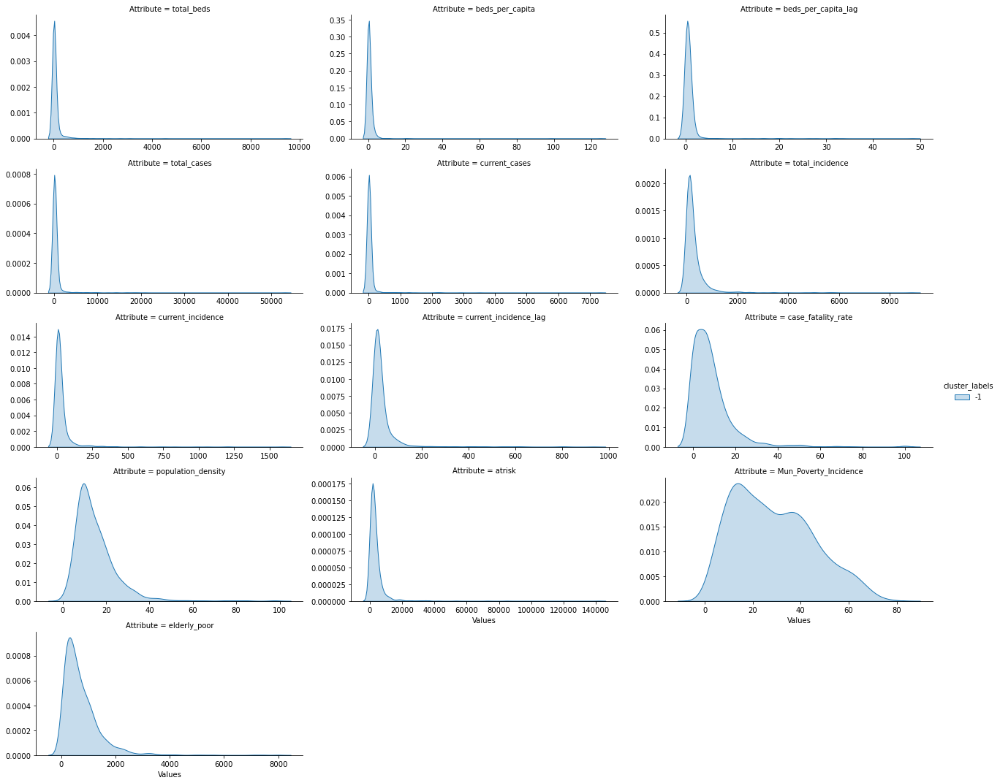

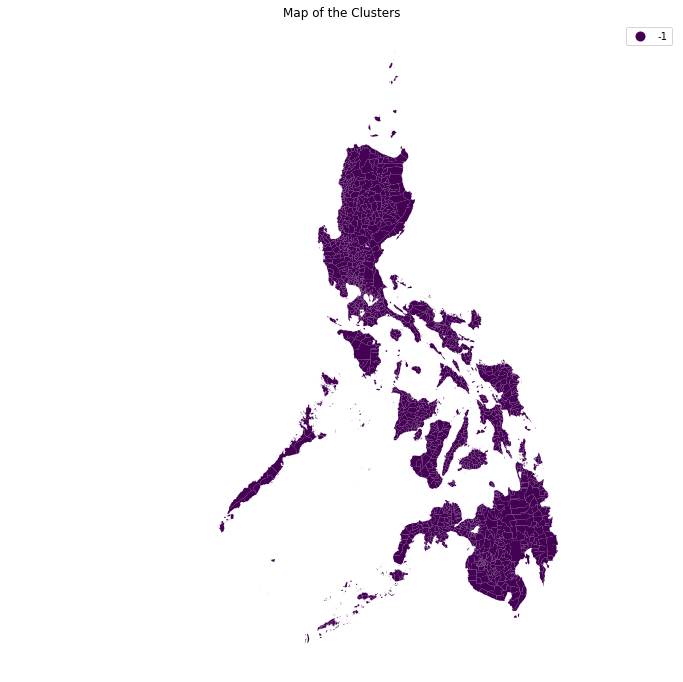

In [335]:
dbscan = final_df.copy()
dbscan['cluster_labels'] = produceClustersDbscan(dbscan[variable])
evaluator(dbscan, variable)
mapper(dbscan)

## Mean Shift

In [336]:
#to produce clusters
from sklearn.cluster import MeanShift
def produceClustersMS(scaled_df, random_state=2):
    model = MeanShift()
    return model.fit_predict(scaled_df)

0     1457
12     112
1       32
2        5
6        5
4        4
3        3
7        3
5        2
15       1
8        1
9        1
10       1
11       1
13       1
14       1
32       1
31       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
16       1
Name: cluster_labels, dtype: int64


C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.war

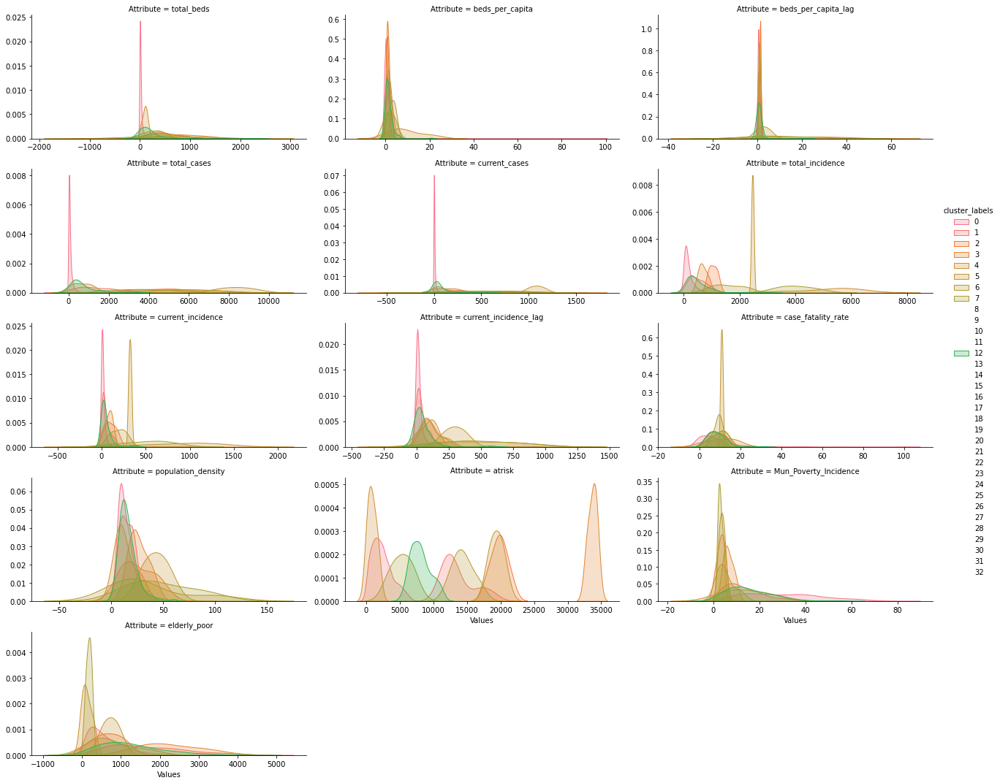

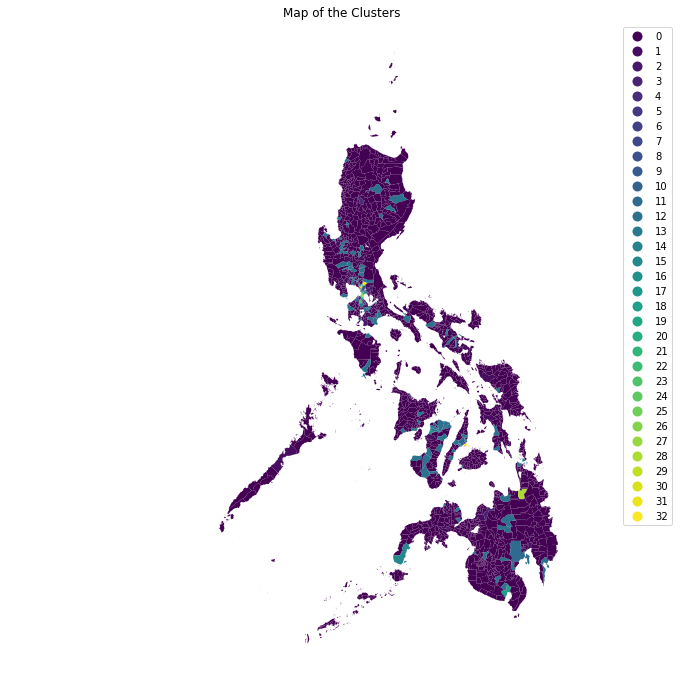

In [337]:
meanshift = final_df.copy()
meanshift['cluster_labels'] = produceClustersMS(meanshift[variable])
evaluator(meanshift, variable)
mapper(meanshift)

## Spectral Clustering

In [338]:
#to produce clusters
from sklearn.cluster import SpectralClustering
def produceClustersSC(n_clusters, scaled_df, random_state=2):
    model = SpectralClustering(n_clusters=n_clusters, random_state=random_state)
    return model.fit_predict(scaled_df)

C:\Users\gear\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
C:\Users\gear\anaconda3\lib\site-packages\numpy\core\_methods.py:205: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\gear\anaconda3\lib\site-packages\sklearn\utils\extmath.py:153: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\gear\anaconda3\lib\site-packages\sklearn\metrics\pairwise.py:311: RuntimeWarning: invalid value encountered in add
  distances += XX
C:\Users\gear\anaconda3\lib\site-packages\sklearn\utils\extmath.py:153: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\gear\anaconda3\lib\site-packages\sklearn\metrics\pairwise.py:311: RuntimeWarning: invalid value encountered in add
  distances += XX
C:\Users\gear\anaconda3\lib\site-packages\sklearn\utils\ex

0    1647
Name: cluster_labels, dtype: int64


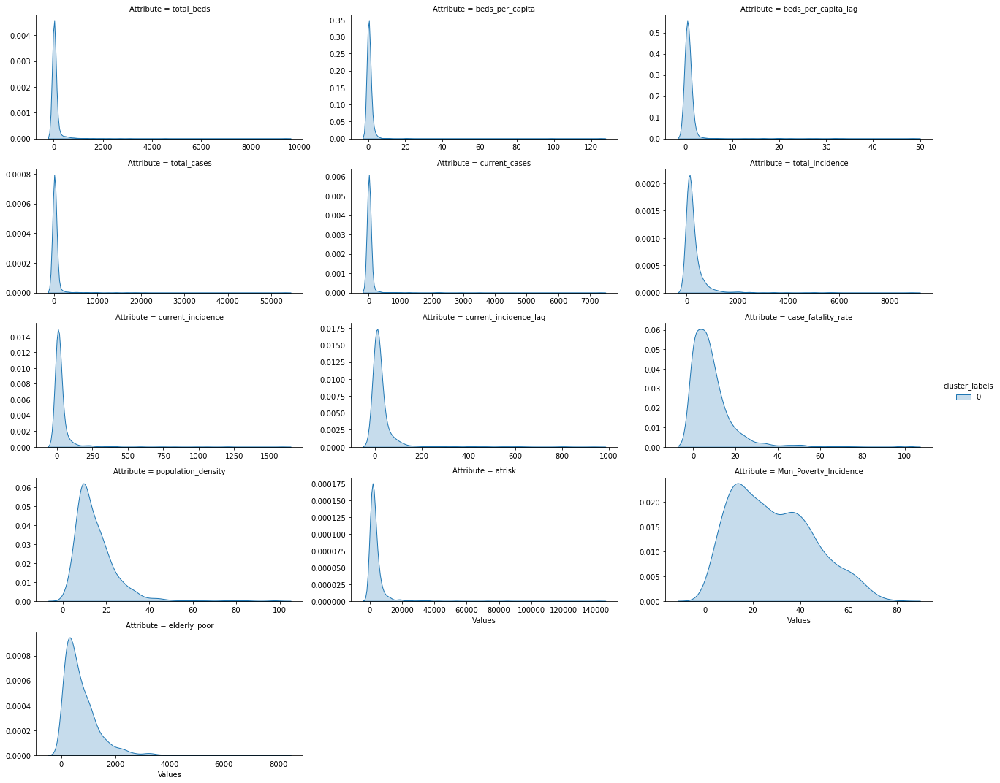

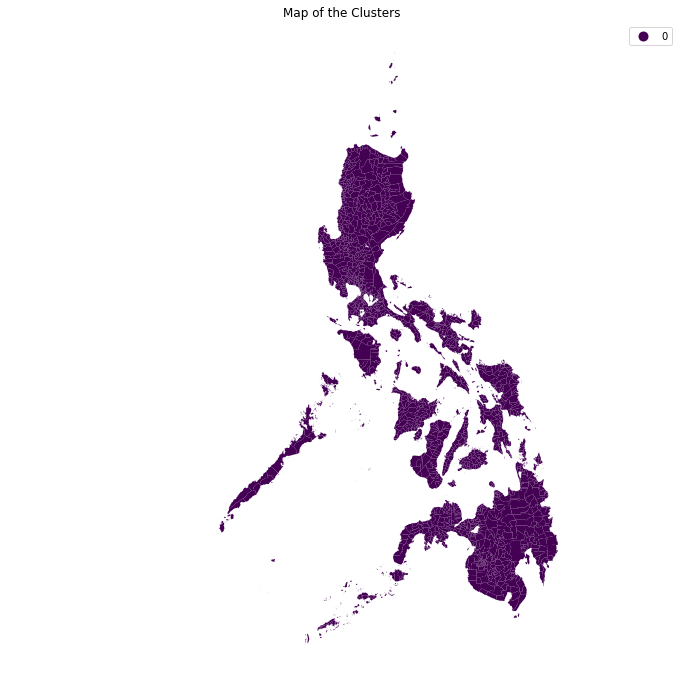

In [339]:
spectral = final_df.copy()
spectral['cluster_labels'] = produceClustersSC(4, spectral[variable])
evaluator(spectral, variable)
mapper(spectral)

## Gaussian Mixture Model

In [340]:
#to produce clusters
from sklearn.mixture import GaussianMixture
def produceClustersGM(n_components, scaled_df, random_state=2):
    model = GaussianMixture(n_components=n_components, random_state=random_state)
    model.fit(scaled_df)
    return model.predict(scaled_df)

0    1390
2     253
1       3
3       1
Name: cluster_labels, dtype: int64


C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.war

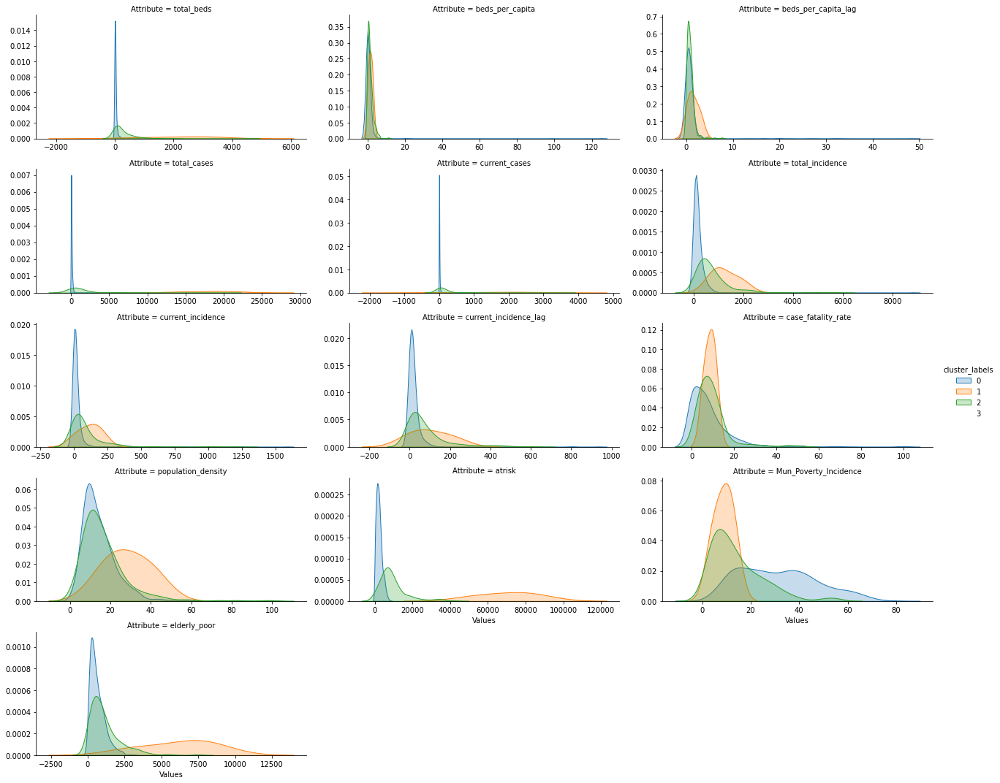

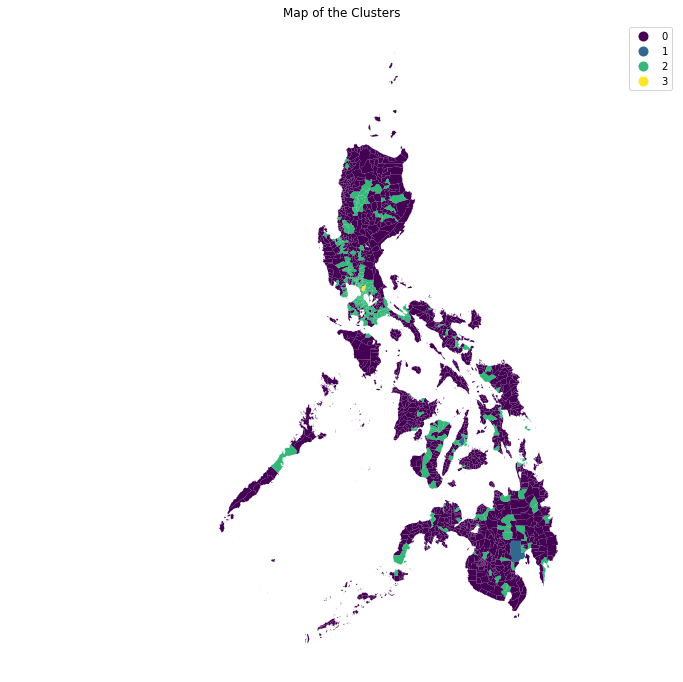

In [341]:
gaussian = final_df.copy()
gaussian['cluster_labels'] = produceClustersGM(4, gaussian[variable])
evaluator(gaussian, variable)
mapper(gaussian)